In [1]:
%matplotlib inline

import cv2 
from matplotlib import pyplot as plt
import numpy as np
import math

from slid import *

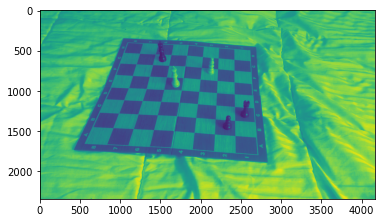

In [19]:
path = "/Users/rizo/Dropbox/chess/1.jpg"
src = cv2.imread(path)
src = cv2.cvtColor(src,cv2.COLOR_BGR2GRAY)
plt.imshow(src)
plt.show()

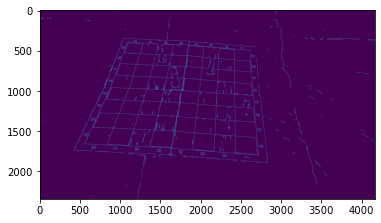

In [39]:
dst = cv2.Canny(src, 50, 200, None, 3)
plt.imshow(dst)
plt.show()

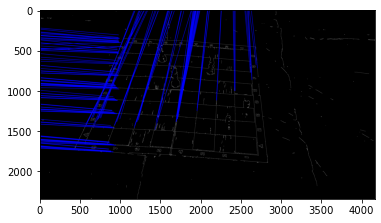

In [40]:
lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)

cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
cdstP = np.copy(cdst)
# Draw the lines
if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
        cv2.line(cdst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)

plt.imshow(cdst)

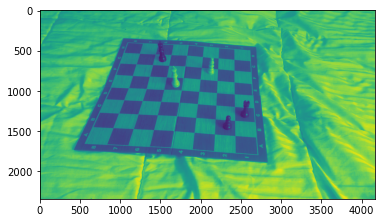

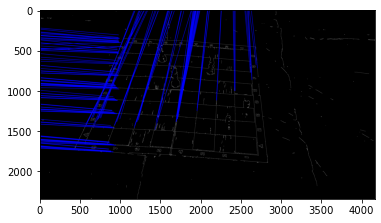

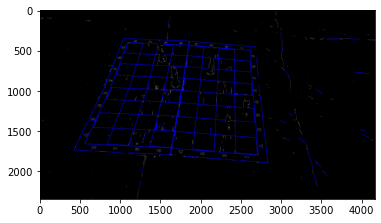

In [44]:
# Probabilistic Line Transform
linesP = cv2.HoughLinesP(dst, 1, np.pi / 180, 50, None, 50, 10)

if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(cdstP, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)

plt.imshow(src)
plt.show()
plt.imshow(cdst)
plt.show()
plt.imshow(cdstP, cmap=plt.get_cmap('viridis'))
plt.show()

In [42]:
plt.get_cmap('binary')

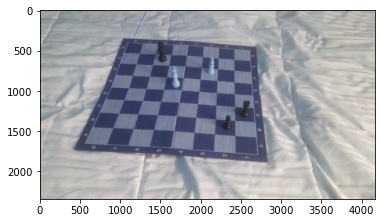

In [52]:
img = cv2.imread(path)
  
# Convert the img to grayscale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  
# Apply edge detection method on the image
edges = cv2.Canny(gray,50,150,apertureSize = 3)
  
# This returns an array of r and theta values
lines = cv2.HoughLines(edges,1,np.pi/180, 5)
  
# The below for loop runs till r and theta values 
# are in the range of the 2d array
for r,theta in lines[0]:
      
    # Stores the value of cos(theta) in a
    a = np.cos(theta)
  
    # Stores the value of sin(theta) in b
    b = np.sin(theta)
      
    # x0 stores the value rcos(theta)
    x0 = a*r
      
    # y0 stores the value rsin(theta)
    y0 = b*r
      
    # x1 stores the rounded off value of (rcos(theta)-1000sin(theta))
    x1 = int(x0 + 1000*(-b))
      
    # y1 stores the rounded off value of (rsin(theta)+1000cos(theta))
    y1 = int(y0 + 1000*(a))
  
    # x2 stores the rounded off value of (rcos(theta)+1000sin(theta))
    x2 = int(x0 - 1000*(-b))
      
    # y2 stores the rounded off value of (rsin(theta)-1000cos(theta))
    y2 = int(y0 - 1000*(a))
      
    # cv2.line draws a line in img from the point(x1,y1) to (x2,y2).
    # (0,0,255) denotes the colour of the line to be 
    #drawn. In this case, it is red. 
    cv2.line(img,(x1,y1), (x2,y2), (0,0,255),2)
      
# All the changes made in the input image are finally
# written on a new image houghlines.jpg
plt.imshow(cv2.GaussianBlur(img, (7, 7), 2))

In [355]:
len(lines)

2

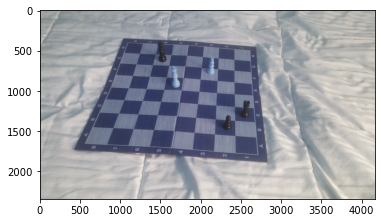

In [86]:
plt.imshow(img)

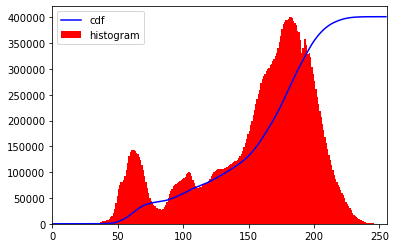

In [99]:
# CLAHE (contrast enhancement)
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

In [100]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img2 = cdf[img]

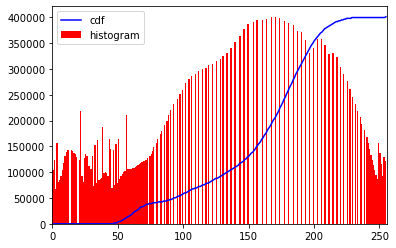

In [104]:
hist,bins = np.histogram(img2.flatten(),256,[0,256])
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img2.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

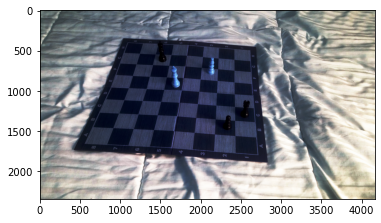

In [108]:
plt.imshow(img2)

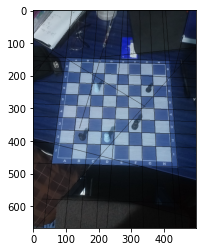

In [365]:
plt.imshow(img)

In [93]:
img = cv2.imread(path)
equ = cv2.equalizeHist(img)
res = np.hstack((img,equ)) #stacking images side-by-side
plt.imshow(equ)

error: OpenCV(4.2.0) /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/histogram.cpp:3439: error: (-215:Assertion failed) _src.type() == CV_8UC1 in function 'equalizeHist'


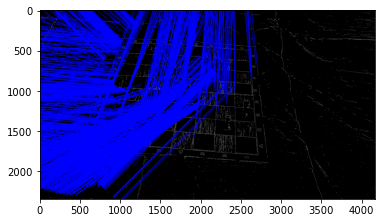

In [133]:
dst = cv2.Canny(equ, 150, 200, None, 3)

lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)

cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
cdstP = np.copy(cdst)
# Draw the lines
if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
        cv2.line(cdst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)

plt.imshow(cdst)

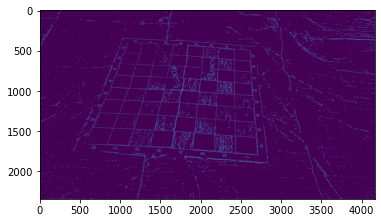

In [119]:
plt.imshow(dst)

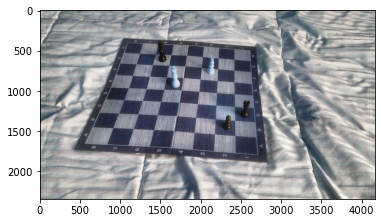

In [131]:


R, G, B = cv2.split(img)

# create a CLAHE object (Arguments are optional).
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
# cl1 = clahe.apply(img2)

output1_R = clahe.apply(R)
output1_G = clahe.apply(G)
output1_B = clahe.apply(B)




equ = cv2.merge((output1_R, output1_G, output1_B))
plt.imshow(equ)



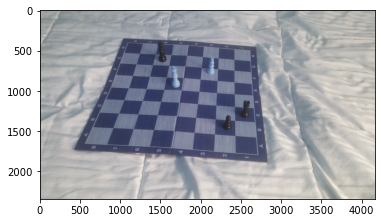

In [132]:
plt.imshow(img)

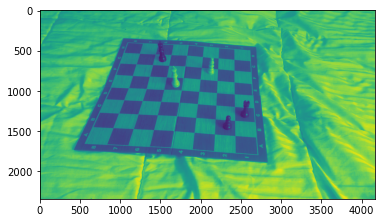

In [134]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)

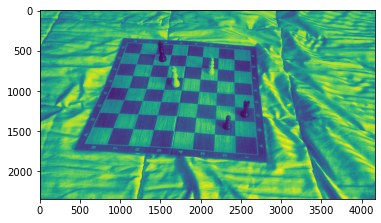

In [136]:
# create a CLAHE object (Arguments are optional).
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(gray)

plt.imshow(cl1)

In [168]:
def detect_lines(img, threshold= 50):
    dst = cv2.Canny(img, threshold, 200, None, 3)
    lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)

    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)
    # Draw the lines
    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            cv2.line(cdst, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)

    plt.imshow(cdst)

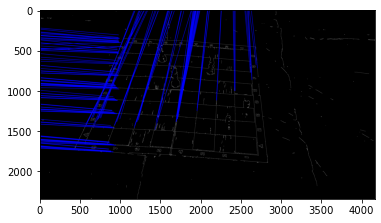

In [169]:
detect_lines(src)

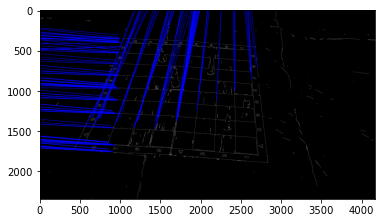

In [170]:
detect_lines(img)

In [183]:
def slid_canny(img, sigma=0.25):
	"""apply Canny edge detector (automatic thresh)"""
	v = np.median(img)
	img = cv2.medianBlur(img, 5)
	img = cv2.GaussianBlur(img, (7, 7), 2)
	lower = int(max(0, (1.0 - sigma) * v))
	upper = int(min(255, (1.0 + sigma) * v))
	print(lower, upper)
	return cv2.Canny(img, lower, upper)

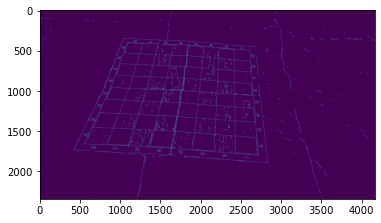

In [192]:
plt.imshow(cv2.Canny(src, 80, 150))

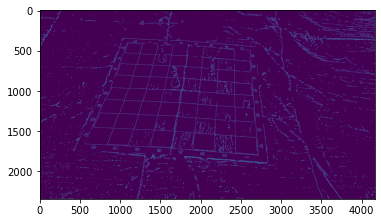

In [204]:
plt.imshow(cv2.Canny(enhance_contrast(src), 100, 200))

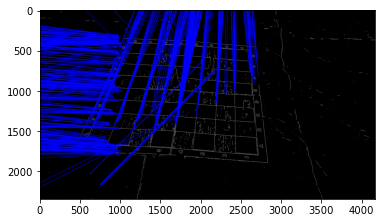

In [209]:
detect_lines(cv2.Canny(src, 80, 150))

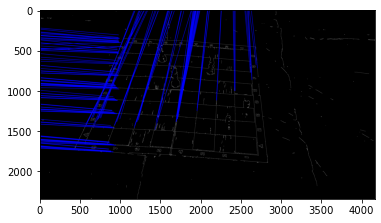

In [210]:
detect_lines(src)

In [207]:
def enhance_contrast(img):
    # CLAHE (contrast enhancement)
    hist,bins = np.histogram(img.flatten(),256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    img2 = cdf[img]
    
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    img2 = cdf[img]
    hist,bins = np.histogram(img2.flatten(),256,[0,256])
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    return img2

def clahe(img):
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img)
    return cl1

In [162]:

import debug, utils
NC_SLID_CLAHE = [[3,   (2, 6),    5], # @1
		         [3,   (6, 2),    5], # @2
				 [5,   (3, 3),    5], # @3
				 [0,   (0, 0),    0]] # EE
def pSLID(img, thresh=150):
	"""find all lines using different settings"""
	print(utils.call("pSLID(img)"))
	segments = []; i = 0
	for key, arr in enumerate(NC_SLID_CLAHE):
		tmp = slid_clahe(img, limit=arr[0], grid=arr[1], iters=arr[2])
		__segments = list(slid_detector(slid_canny(tmp), thresh))
		segments += __segments; i += 1
		print("FILTER: {} {} : {}".format(i, arr, len(__segments)))
		debug.image(slid_canny(tmp)).lines(__segments).save("pslid_F%d" % i)
	return segments


ValueError: not enough values to unpack (expected 2, got 0)

In [165]:

import debug
NC_SLID_CLAHE = [[3,   (2, 6),    5], # @1
		         [3,   (6, 2),    5], # @2
				 [5,   (3, 3),    5], # @3
				 [0,   (0, 0),    0]] # EE

def slid_canny(img, sigma=0.25):
	"""apply Canny edge detector (automatic thresh)"""
	v = np.median(img)
	img = cv2.medianBlur(img, 5)
	img = cv2.GaussianBlur(img, (7, 7), 2)
	lower = int(max(0, (1.0 - sigma) * v))
	upper = int(min(255, (1.0 + sigma) * v))
	return cv2.Canny(img, lower, upper)


def slid_detector(img, alfa=150, beta=2):
	"""detect lines using Hough algorithm"""
	__lines, lines = [], cv2.HoughLinesP(img, rho=1, theta=np.pi/360*beta,
		threshold=40, minLineLength=50, maxLineGap=15) # [40, 40, 10]
	if lines is None: return []
	for line in np.reshape(lines, (-1, 4)):
		__lines += [[[int(line[0]), int(line[1])],
			         [int(line[2]), int(line[3])]]]
	return __lines

def slid_clahe(img, limit=2, grid=(3,3), iters=5):
	"""repair using CLAHE algorithm (adaptive histogram equalization)"""
	img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
	for i in range(iters):
		img = cv2.createCLAHE(clipLimit=limit, \
				tileGridSize=grid).apply(img)
	debug.image(img).save("slid_clahe_@1")
	if limit != 0:
		kernel = np.ones((10, 10), np.uint8)
		img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
		debug.image(img).save("slid_clahe_@2")
	return img

def pSLID(img, thresh=150):
	"""find all lines using different settings"""
	# print(utils.call("pSLID(img)"))
	segments = []; i = 0
	for key, arr in enumerate(NC_SLID_CLAHE):
		tmp = slid_clahe(img, limit=arr[0], grid=arr[1], iters=arr[2])
		__segments = list(slid_detector(slid_canny(tmp), thresh))
		segments += __segments; i += 1
		print("FILTER: {} {} : {}".format(i, arr, len(__segments)))
		debug.image(slid_canny(tmp)).lines(__segments).save("pslid_F%d" % i)
	return segments


In [166]:
pSLID(img)

FILTER: 1 [3, (2, 6), 5] : 126
FILTER: 2 [3, (6, 2), 5] : 142
FILTER: 3 [5, (3, 3), 5] : 219
FILTER: 4 [0, (0, 0), 0] : 0


[[[1922, 390], [2077, 404]],
 [[2014, 399], [2523, 443]],
 [[554, 1459], [586, 1394]],
 [[705, 1149], [752, 1053]],
 [[1761, 1149], [1877, 1159]],
 [[3818, 323], [4159, 340]],
 [[537, 129], [653, 133]],
 [[1625, 375], [1694, 377]],
 [[2737, 1062], [2758, 1258]],
 [[1245, 1294], [1435, 1303]],
 [[1172, 1459], [1204, 1357]],
 [[879, 141], [936, 144]],
 [[1909, 160], [1967, 162]],
 [[2784, 1490], [2801, 1635]],
 [[1077, 1119], [1271, 1129]],
 [[1651, 1312], [1938, 1337]],
 [[3524, 2001], [3563, 2052]],
 [[1419, 1482], [1473, 1265]],
 [[1964, 1168], [2133, 1180]],
 [[3828, 230], [3905, 233]],
 [[676, 133], [740, 136]],
 [[3461, 1914], [3520, 1992]],
 [[1224, 1289], [1272, 1140]],
 [[1234, 2208], [1250, 2139]],
 [[3911, 283], [4077, 289]],
 [[1421, 1485], [1604, 1495]],
 [[2699, 689], [2705, 755]],
 [[1546, 2207], [1610, 2200]],
 [[600, 1364], [669, 1222]],
 [[4048, 321], [4106, 325]],
 [[3559, 253], [3644, 255]],
 [[1920, 1516], [1941, 1341]],
 [[3809, 248], [3926, 254]],
 [[678, 1392], [7

In [215]:
all_points = []
def SLID(img, segments):
	# FIXME: zrobic 2 rodzaje haszowania (katy + pasy [blad - delta])
	# print(utils.call("SLID(img, segments)"))
	
	global all_points; all_points = []
	pregroup, group, hashmap, raw_lines = [[], []], {}, {}, []

	__cache = {}
	def __dis(a, b):
		idx = hash("__dis" + str(a) + str(b))
		if idx in __cache: return __cache[idx]
		__cache[idx] = np.linalg.norm(na(a)-na(b))
		return __cache[idx]

	X = {}
	def __fi(x):
		if x not in X: X[x] = 0;
		if (X[x] == x or X[x] == 0): X[x] = x
		else:                        X[x] = __fi(X[x])
		return X[x]
	def __un(a, b):
		ia, ib = __fi(a), __fi(b)
		X[ia] = ib; group[ib] |= group[ia]
		#group[ia] = set()
		#group[ia] = set()

	# shortest path // height
	nln = lambda l1, x, dx: \
		np.linalg.norm(np.cross(na(l1[1])-na(l1[0]),
								na(l1[0])-na(   x)))/dx

	def __similar(l1, l2):
		da, db = __dis(l1[0], l1[1]), __dis(l2[0], l2[1])
		# if da > db: l1, l2, da, db = l2, l1, db, da

		d1a, d2a = nln(l1, l2[0], da), nln(l1, l2[1], da)
		d1b, d2b = nln(l2, l1[0], db), nln(l2, l1[1], db)
	
		ds = 0.25 * (d1a + d1b + d2a + d2b) + 0.00001
		#print(da, db, abs(da-db))
		#print(int(da/ds), int(db/ds), "|", int(abs(da-db)), int(da+db),
		#		int(da+db)/(int(abs(da-db))+0.00001))
		alfa = 0.0625 * (da + db) #15
		# FIXME: roznica???
		#if d1 + d2 == 0: d1 += 0.00001 # [FIXME]: divide by 0
		t1 = (da/ds > alfa and db/ds > alfa)
		if not t1: return False # [FIXME]: dist???
		return True

	def __generate(a, b, n):
		points = []; t = 1/n
		for i in range(n):
			x = a[0] + (b[0]-a[0]) * (i * t)
			y = a[1] + (b[1]-a[1]) * (i * t)
			points += [[int(x), int(y)]]
		return points

	def __analyze(group):
		global all_points
		points = []
		for idx in group:
			points += __generate(*hashmap[idx], 10)
		_, radius = cv2.minEnclosingCircle(na(points)); w = radius * (math.pi/2)
		vx, vy, cx, cy = cv2.fitLine(na(points), cv2.DIST_L2, 0, 0.01, 0.01)
		# debug.color()
		all_points += points
		return [[int(cx-vx*w), int(cy-vy*w)], [int(cx+vx*w), int(cy+vy*w)]]

	for l in segments:
		h = hash(str(l))
		t1 = l[0][0] - l[1][0]
		t2 = l[0][1] - l[1][1]
		hashmap[h] = l; group[h] = set([h]); X[h] = h
		if abs(t1) < abs(t2): pregroup[0].append(l)
		else:                 pregroup[1].append(l)

	debug.image(img.shape) \
		.lines(pregroup[0], color=debug.color()) \
		.lines(pregroup[1], color=debug.color()) \
	.save("slid_pre_groups")

	for lines in pregroup:
		for i in range(len(lines)):
			l1 = lines[i]; h1 = hash(str(l1))
			#print(h1, __fi(h1))
			if (X[h1] != h1): continue
			#if (__fi(h1) != h1): continue
			for j in range(i+1, len(lines)):
				l2 = lines[j]; h2 = hash(str(l2))
				#if (__fi(h2) != h2): continue
				if (X[h2] != h2): continue
				#if (len(group[h2])==0): continue
				if not __similar(l1, l2): continue
				__un(h1, h2) # union & find
				# break # FIXME

	__d = debug.image(img.shape)
	for i in group:
		#if (__fi(i) != i): continue
		if (X[i] != i): continue
		#if len(group[i]) == 0: continue
		ls = [hashmap[h] for h in group[i]]
		__d.lines(ls, color=debug.color())
	__d.save("slid_all_groups")

	for i in group:
		#if (__fi(i) != i): continue
		if (X[i] != i): continue
		#if len(group[i]) == 0: continue
		#if (__fi(i) != i): continue
		raw_lines += [__analyze(group[i])]
	debug.image(img.shape).lines(raw_lines).save("slid_final")

	debug.image(img.shape)\
		.points(all_points, color=(0,255,0), size=2)\
	.lines(raw_lines).save("slid_final2")

	return raw_lines

In [216]:
SLID(src, [])

[]

In [217]:
segments = pSLID(src)

error: OpenCV(4.2.0) /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function 'cv::impl::(anonymous namespace)::CvtHelper<cv::impl::(anonymous namespace)::Set<3, 4, -1>, cv::impl::(anonymous namespace)::Set<1, -1, -1>, cv::impl::(anonymous namespace)::Set<0, 2, 5>, cv::impl::(anonymous namespace)::SizePolicy::NONE>::CvtHelper(cv::InputArray, cv::OutputArray, int) [VScn = cv::impl::(anonymous namespace)::Set<3, 4, -1>, VDcn = cv::impl::(anonymous namespace)::Set<1, -1, -1>, VDepth = cv::impl::(anonymous namespace)::Set<0, 2, 5>, sizePolicy = cv::impl::(anonymous namespace)::SizePolicy::NONE]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


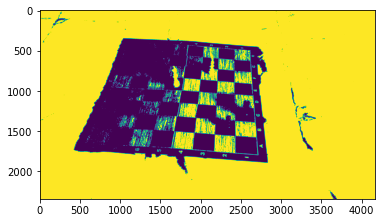

In [221]:
img = cv2.imread(path, 0)
blur = cv2.GaussianBlur(img,(5,5),0)
_, img_binary = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.imshow(img_binary)


In [223]:
delta 

NameError: name 'delta' is not defined

In [224]:
def f(a):
    def g(a):
        return a+1
    return g(a) + 1

In [227]:
f_g(5)

NameError: name 'f_g' is not defined

In [228]:
s1 = {"a", "b", "c"}
s2 = {"d", "e", "f"}

s1 |= s2

In [229]:
s1

{'a', 'b', 'c', 'd', 'e', 'f'}

In [263]:
def f(a):
    def g(b):
        return b+5
    return g(a+2)
g(3)

NameError: name 'g' is not defined

In [8]:
def slid_clahe(img, limit=2, grid=(3,3), iters=5):
	"""repair using CLAHE algorithm (adaptive histogram equalization)"""
	img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
	for i in range(iters):
		img = cv2.createCLAHE(clipLimit=limit, \
				tileGridSize=grid).apply(img)
	# plt.imshow(img)
	# plt.show()
	if limit != 0:
		kernel = np.ones((10, 10), np.uint8)
		img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
		# plt.imshow(img)
		# plt.show()
	return img

def pSLID(img, thresh=150):
	"""find all lines using different settings"""
	segments = []; i = 0
	for key, arr in enumerate(CLAHE_PARAMS):
		tmp = slid_clahe(img, limit=arr[0], grid=arr[1], iters=arr[2])
		curr_segments = list(slid_detector(slid_canny(tmp), thresh))
		segments += curr_segments; i += 1
		print("FILTER: {} {} : {}".format(i, arr, len(curr_segments)))
	return segments
CLAHE_PARAMS = [[3,   (2, 6),    5], # @1
		         [3,   (6, 2),    5], # @2
				 [5,   (3, 3),    5], # @3
				 [0,   (0, 0),    0]] # EE

def slid_detector(img, alfa=150, beta=2):
	"""detect lines using Hough algorithm"""
	__lines, lines = [], cv2.HoughLinesP(img, rho=1, theta=np.pi/360*beta,
		threshold=40, minLineLength=50, maxLineGap=15) # [40, 40, 10]
	if lines is None: return []
	for line in np.reshape(lines, (-1, 4)):
		__lines += [[[int(line[0]), int(line[1])],
			         [int(line[2]), int(line[3])]]]
	return __lines

def slid_canny(img, sigma=0.25):
	"""apply Canny edge detector (automatic thresh)"""
	v = np.median(img)
	img = cv2.medianBlur(img, 5)
	img = cv2.GaussianBlur(img, (7, 7), 2)
	lower = int(max(0, (1.0 - sigma) * v))
	upper = int(min(255, (1.0 + sigma) * v))
	return cv2.Canny(img, lower, upper)

In [261]:
class DisjointSet(object):

    def __init__(self):
        self.map = {}

    def find(self, x):
        if x not in X:
            self.map[x] = x
        if self.map[x] != x:
            self.map[x] = self.find(self.map[x])
        return self.map[x]
        
    
    def get(self, x):
        return self.map[x]
    
    def set(self, x, val):
        self.map[x] = val

In [20]:
arr = np.array

all_points = []
def SLID(img, segments):
    global all_points
    all_points = []

    pregroup, group, hashmap, raw_lines = [[], []], {}, {}, []

    dists = {}
    def dist(a, b):
        h = hash("dist"+str(a)+str(b))
        if h not in dists:
            dists[h] = np.linalg.norm(arr(a)-arr(b))
        return dists[h]

    parents = {}
    def find(x):
        if x not in parents:
            parents[x] = x
        if parents[x] != x:
            parents[x] = find(parents[x])
        return parents[x]
    
    def union(a, b):
        par_a = find(a)
        par_b = find(b)
        parents[par_a] = par_b
        group[par_b] |= group[par_a]
    
    def height(line, pt):
        v = np.cross(arr(line[1])-arr(line[0]), arr(pt)-arr(line[0]))
        # Using dist() to speed up distance look-up since the 2-norm 
        # is used many times
        return np.linalg.norm(v)/dist(line[1], line[0])
    
    def are_similar(l1, l2):
        '''See Sec.3.2.2 in Czyzewski et al.'''
        a = dist(l1[0], l1[1])
        b = dist(l2[0], l2[1])

        x1 = height(l2, l1[0])
        x2 = height(l2, l1[1])
        y1 = height(l1, l2[0])
        y2 = height(l1, l2[1])

        gamma = 0.25 * (x1+x2+y1+y2)

        img_width = 500
        img_height = 282
        p = 0.
        A = img_width*img_height
        w = np.pi/2 / np.sqrt(np.sqrt(A))
        t_delta = p*w
        t_delta = 0.0625

        delta = (a+b) * t_delta

        return (a/gamma > delta) and (b/gamma > delta)

    def generate_line(a, b, n):
        points = []
        for i in range(n):
            x = a[0] + (b[0] - a[0]) * (i/n)
            y = a[1] + (b[1] - a[1]) * (i/n)
            points += [[int(x), int(y)]]
        return points

    def analyze(group):
        global all_points
        points = []
        for idx in group:
            points += generate_line(*hashmap[idx], 10)
            print(idx)
        _, radius = cv2.minEnclosingCircle(arr(points))
        w = radius * np.pi / 2
        vx, vy, cx, cy = cv2.fitLine(arr(points), cv2.DIST_L2, 0, 0.01, 0.01)
        all_points += points
        return [[int(cx-vx*w), int(cy-vy*w)], [int(cx+vx*w), int(cy+vy*w)]]
    
    for l in segments:
        h = hash(str(l))
        # Initialize the line
        hashmap[h] = l
        group[h] = set([h])
        parents[h] = h

        wid = l[0][0] - l[1][0]
        hei = l[0][1] - l[1][1]

        # Divide lines into more horizontal vs more vertical 
        # to speed up comparison later
        if abs(wid) < abs(hei):
            pregroup[0].append(l)
        else:
            pregroup[1].append(l)

    for lines in pregroup:
        for i in range(len(lines)):
            l1 = lines[i]
            h1 = hash(str(l1))
            # We're looking for the root line of each disjoint set
            if parents[h1] != h1:
                continue
            for j in range(i+1, len(lines)):
                l2 = lines[j]
                h2 = hash(str(l2))
                if parents[h2] != h2:
                    continue
                if are_similar(l1, l2):
                    # Merge lines into a single disjoint set
                    union(h1, h2)
    
    for h in group:
        if parents[h] != h: 
            continue
        raw_lines += [analyze(group[h])]
    
    return raw_lines

In [379]:
clahe = slid_clahe(img)
segments = pSLID(img)
lines = SLID(img, segments)
print(len(lines))

114 190
FILTER: 1 [3, (2, 6), 5] : 8
109 182
FILTER: 2 [3, (6, 2), 5] : 8
114 190
FILTER: 3 [5, (3, 3), 5] : 14
35 58
FILTER: 4 [0, (0, 0), 0] : 48
{-389133285525669491}
-389133285525669491
{-8768270882458058800}
-8768270882458058800
{3010812930719681457, 2901226587183726518}
3010812930719681457
2901226587183726518
{-6308036267131108665}
-6308036267131108665
{4135094936176412838}
4135094936176412838
{6563622600093404873, -6676549903961267431}
6563622600093404873
-6676549903961267431
{-4695292850922669013}
-4695292850922669013
{-1156840801612715884, 4554931522187236524}
-1156840801612715884
4554931522187236524
{4395900408052248888}
4395900408052248888
{6327310680804627863, -7648416741043712705, -1320045345208205498}
6327310680804627863
-7648416741043712705
-1320045345208205498
{7930489784966570541, -2651838230671566035, 1776470100122201877}
7930489784966570541
-2651838230671566035
1776470100122201877
{-6866128523840391089, 6019195499995892298, -4144926153346348226, -6723106772132587008}

In [30]:
all_points = []
def SLID(img, segments):
	na = np.array
	# FIXME: zrobic 2 rodzaje haszowania (katy + pasy [blad - delta])
	# print(utils.call("SLID(img, segments)"))
	
	global all_points; all_points = []
	pregroup, group, hashmap, raw_lines = [[], []], {}, {}, []

	__cache = {}
	def __dis(a, b):
		idx = hash("__dis" + str(a) + str(b))
		if idx in __cache: return __cache[idx]
		__cache[idx] = np.linalg.norm(na(a)-na(b))
		return __cache[idx]

	X = {}
	def __fi(x):
		if x not in X: X[x] = 0;
		if (X[x] == x or X[x] == 0): X[x] = x
		else:                        X[x] = __fi(X[x])
		return X[x]
	def __un(a, b):
		ia, ib = __fi(a), __fi(b)
		X[ia] = ib; group[ib] |= group[ia]
		#group[ia] = set()
		#group[ia] = set()

	# shortest path // height
	nln = lambda l1, x, dx: \
		np.linalg.norm(np.cross(na(l1[1])-na(l1[0]),
								na(l1[0])-na(   x)))/dx

	def __similar(l1, l2):
		da, db = __dis(l1[0], l1[1]), __dis(l2[0], l2[1])
		# if da > db: l1, l2, da, db = l2, l1, db, da

		d1a, d2a = nln(l1, l2[0], da), nln(l1, l2[1], da)
		d1b, d2b = nln(l2, l1[0], db), nln(l2, l1[1], db)
	
		ds = 0.25 * (d1a + d1b + d2a + d2b) + 0.00001
		#print(da, db, abs(da-db))
		#print(int(da/ds), int(db/ds), "|", int(abs(da-db)), int(da+db),
		#		int(da+db)/(int(abs(da-db))+0.00001))
		alfa = 0.07 * (da + db) #15
		# FIXME: roznica???
		#if d1 + d2 == 0: d1 += 0.00001 # [FIXME]: divide by 0
		t1 = (da/ds > alfa and db/ds > alfa)
		if not t1: return False # [FIXME]: dist???
		return True

	def __generate(a, b, n):
		points = []; t = 1/n
		for i in range(n):
			x = a[0] + (b[0]-a[0]) * (i * t)
			y = a[1] + (b[1]-a[1]) * (i * t)
			points += [[int(x), int(y)]]
		return points

	def __analyze(group):
		global all_points
		points = []
		for idx in group:
			points += __generate(*hashmap[idx], 10)
		_, radius = cv2.minEnclosingCircle(na(points)); w = radius * (math.pi/2)
		vx, vy, cx, cy = cv2.fitLine(na(points), cv2.DIST_L2, 0, 0.01, 0.01)
		# debug.color()
		all_points += points
		return [[int(cx-vx*w), int(cy-vy*w)], [int(cx+vx*w), int(cy+vy*w)]]

	for l in segments:
		h = hash(str(l))
		t1 = l[0][0] - l[1][0]
		t2 = l[0][1] - l[1][1]
		hashmap[h] = l; group[h] = set([h]); X[h] = h
		if abs(t1) < abs(t2): pregroup[0].append(l)
		else:                 pregroup[1].append(l)

	# debug.image(img.shape) \
	# 	.lines(pregroup[0], color=debug.color()) \
	# 	.lines(pregroup[1], color=debug.color()) \
	# .save("slid_pre_groups")

	for lines in pregroup:
		for i in range(len(lines)):
			l1 = lines[i]; h1 = hash(str(l1))
			#print(h1, __fi(h1))
			if (X[h1] != h1): continue
			#if (__fi(h1) != h1): continue
			for j in range(i+1, len(lines)):
				l2 = lines[j]; h2 = hash(str(l2))
				#if (__fi(h2) != h2): continue
				if (X[h2] != h2): continue
				#if (len(group[h2])==0): continue
				if not __similar(l1, l2): continue
				__un(h1, h2) # union & find
				# break # FIXME

	# __d = debug.image(img.shape)
	# for i in group:
	# 	#if (__fi(i) != i): continue
	# 	if (X[i] != i): continue
	# 	#if len(group[i]) == 0: continue
	# 	ls = [hashmap[h] for h in group[i]]
	# 	__d.lines(ls, color=debug.color())
	# __d.save("slid_all_groups")

	for i in group:
		#if (__fi(i) != i): continue
		if (X[i] != i): continue
		#if len(group[i]) == 0: continue
		#if (__fi(i) != i): continue
		raw_lines += [__analyze(group[i])]
	# debug.image(img.shape).lines(raw_lines).save("slid_final")

	# debug.image(img.shape)\
	# 	.points(all_points, color=(0,255,0), size=2)\
	# .lines(raw_lines).save("slid_final2")

	return raw_lines

def slid_tendency(raw_lines, s=4): # FIXME: [1.25 -> 2]
	# print(utils.call("slid_tendency(raw_lines)"))
	lines = []; scale = lambda x, y, s: \
		int(x * (1+s)/2 + y * (1-s)/2)
	for a, b in raw_lines:
		# [A] s - scale
		# Xa' = Xa (1+s)/2 + Xb (1-s)/2
		# Ya' = Ya (1+s)/2 + Yb (1-s)/2
		a[0] = scale(a[0], b[0], s)
		a[1] = scale(a[1], b[1], s)
		# [B] s - scale
		# Xb' = Xb (1+s)/2 + Xa (1-s)/2
		# Yb' = Yb (1+s)/2 + Ya (1-s)/2
		b[0] = scale(b[0], a[0], s)
		b[1] = scale(b[1], a[1], s)
		lines += [[a, b]]
	return lines

FILTER: 1 [3, (2, 6), 5] : 26
FILTER: 2 [3, (6, 2), 5] : 13
FILTER: 3 [5, (3, 3), 5] : 28
FILTER: 4 [0, (0, 0), 0] : 52


/Users/rizo/Documents/Projects/chess-cv/slid.py:119: RuntimeWarning: divide by zero encountered in double_scalars
  return (a/gamma > delta) and (b/gamma > delta)


-6895963487280945923
742757639224923830
-8297215869526976251
874983037570196396
-2917726280256004014
3941502387912854304
-3569395771306640973
299587090981208933
-8941068205166127876
-129101965225751461
-2144285982043727003
-3775800547975509769
4864220562472074361
3225093270955377420
-5467529220443719712
3728154746129708575
-2202502937905256997
8411553250708697515
501897046517316624
-7029730417133005532
2137475594128787540
2299598651596421511
6114277683373676443
-965839027340144723
-2665836034475975644
-8248407669833316009
6900142333497265326
5433283892114465425
-3679195629723761194
-3456143043307836232
241228567553441273
-8587907226781623897
-2460688666115424105
76596190303716994
8062435541833123011
-3067088027640191347
589901583296511704
5141830229288258513
1086379495263356824
2965585664279937501
7943085367516896924
5636987609992602006
-6823865735763632892
6964401926694972561
157474706094211839
-5178063493571812654
9016711562919445358
6529823485622065889
-5075750705600406230
540965774

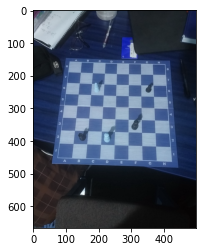

In [82]:
path_scaled = "/Users/rizo/Dropbox/chess/2_scaled.jpg"
src = cv2.imread(path_scaled)
# img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
segments = pSLID(src)
raw_lines = SLID(src, segments)
lines = slid_tendency(raw_lines)
img = src.copy()
# for l in lines:
#     img = cv2.line(img, tuple(l[0]), tuple(l[1]), (255,0,0), 1)
plt.imshow(img)
# plt.savefig("ASD", dpi=300)

In [280]:
def generate_line(a, b, n):
    points = []
    for i in range(n):
        x = a[0] + (b[0] - a[0]) * (i/n)
        y = a[1] + (b[1] - a[1]) * (i/n)
        points += [[int(x), int(y)]]
    return points

generate_line([0,0], [5,5], 2)

[[0, 0], [2, 2]]

In [49]:
import deps

import collections
import scipy, scipy.cluster
from keras.models import model_from_json

model_path = "data/models/laps.model.json"
weights_path = "data/models/laps.weights.h5"
NEURAL_MODEL = model_from_json(open(model_path, 'r').read())
NEURAL_MODEL.load_weights(weights_path)


In [50]:
def laps_intersections(lines):
	'''Find all intersections'''
	__lines = [[(a[0], a[1]), (b[0], b[1])] for a, b in lines]
	return deps.geometry.isect_segments(__lines)

def laps_cluster(points, max_dist=10):
	"""cluster very similar points"""
	Y = scipy.spatial.distance.pdist(points)
	Z = scipy.cluster.hierarchy.single(Y)
	T = scipy.cluster.hierarchy.fcluster(Z, max_dist, 'distance')
	clusters = collections.defaultdict(list)
	for i in range(len(T)):
		clusters[T[i]].append(points[i])
	clusters = clusters.values()
	clusters = map(lambda arr: (np.mean(np.array(arr)[:,0]),
		                        np.mean(np.array(arr)[:,1])), clusters)
	return list(clusters) # if two points are close, they become one mean point

def laps_detector(img):
	"""determine if that shape is positive"""
	global NC_LAYER

	hashid = str(hash(img.tostring()))

	img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
	img = cv2.threshold(img, 0, 255, cv2.THRESH_OTSU)[1]
	img = cv2.Canny(img, 0, 255)	
	img = cv2.resize(img, (21, 21), interpolation=cv2.INTER_CUBIC)
	
	imgd = img

	X = [np.where(img>int(255/2), 1, 0).ravel()]
	X = X[0].reshape([-1, 21, 21, 1])

	img = cv2.dilate(img, None)
	mask = cv2.copyMakeBorder(img, top=1, bottom=1, left=1, right=1,
		borderType=cv2.BORDER_CONSTANT, value=[255,255,255])
	mask = cv2.bitwise_not(mask); i = 0
	# _1, contours, _2 = cv2.findContours(mask,cv2.RETR_EXTERNAL,
	contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL,
				                             cv2.CHAIN_APPROX_NONE)
	
	_c = np.zeros((23,23,3), np.uint8)

	# geometric detector
	for cnt in contours:
		(x,y),radius = cv2.minEnclosingCircle(cnt); x,y=int(x),int(y)
		approx = cv2.approxPolyDP(cnt,0.1*cv2.arcLength(cnt,True),True)
		if len(approx) == 4 and radius < 14:
			cv2.drawContours(_c, [cnt], 0, (0,255,0), 1)
			i += 1
		else:
			cv2.drawContours(_c, [cnt], 0, (0,0,255), 1)
	
	if i == 4: return (True, 1)

	pred = NEURAL_MODEL.predict(X)
	a, b = pred[0][0], pred[0][1]
	t = a > b and b < 0.03 and a > 0.975

	# decision
	if t:
		return (True, pred[0])
	else:
		return (False, pred[0])

################################################################################

def LAPS(img, lines, size=10):

	__points, points = laps_intersections(lines), []
	# debug.image(img).points(__points, size=3).save("laps_in_queue")

	for pt in __points:
		# pixels are in integers
		pt = list(map(int, pt))

		# size of our analysis area
		lx1 = max(0, int(pt[0]-size-1)); lx2 = max(0, int(pt[0]+size))
		ly1 = max(0, int(pt[1]-size)); ly2 = max(0, int(pt[1]+size+1))

		# cropping for detector
		dimg = img[ly1:ly2, lx1:lx2]
		dimg_shape = np.shape(dimg)
		
		# not valid
		if dimg_shape[0] <= 0 or dimg_shape[1] <= 0: continue

		# use neural network
		re_laps = laps_detector(dimg)
		if not re_laps[0]: continue

		# add if okay
		if pt[0] < 0 or pt[1] < 0: continue
		points += [pt]
	points = laps_cluster(points)

	# debug.image(img).points(points, size=5, \
	# 	color=debug.color()).save("laps_good_points")
	
	return points


In [39]:
from tensorflow import keras
keras.optimizers.RMSprop

tensorflow.python.keras.optimizer_v2.rmsprop.RMSprop

FILTER: 1 [3, (2, 6), 5] : 12
FILTER: 2 [3, (6, 2), 5] : 9
FILTER: 3 [5, (3, 3), 5] : 18
FILTER: 4 [0, (0, 0), 0] : 53
-466184915420850587
1925874463036478159
1726737622117099408
4169526641456168191
-1344150493101623337
-750355535581375869
8349726420827859418
1457922573002153247
3519609876786031806
-818854629828468048
5876601819231996623
1804669339558992708
925769297289660555
8810996636089624556
5159890941024653985
-7162432765871684970
8068776968165892601
-2081730714566566635
-461497566524885006
-3166266116214652401
115442348230102458
4956846373128486192
-5199341273493349627
2742287876762960636
-7620082768901278055
8040963699719505955
-176722382085583992
6956313131705725844
-2323503561367104808
3661906593496833849
2759931465003704243
6733175541089644980
-6849685802041377903
-7244565425236770401
-3746230629390777347
7372712913475876844
435168903691632012
1548798343936793309
8566815335882721196
-4077006484531163558
1067428834556766451
5101499205059631466
-2864236426898256073
-53205520168

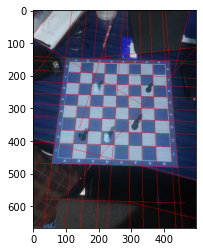

In [51]:
segments = pSLID(img)
raw_lines = SLID(img, segments)
lines = slid_tendency(raw_lines)
plt.imshow(img)

In [83]:
points = LAPS(img, lines, size=10)
for pt in points:
    img = cv2.circle(img, (int(pt[0]), int(pt[1])), 4, (0,0,255), -1)

<ipython-input-50-38bc736ae036>:23: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  hashid = str(hash(img.tostring()))


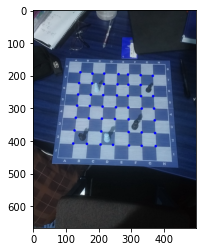

In [84]:
plt.imshow(img)

In [52]:
import scipy, cv2, pyclipper, numpy as np
import matplotlib.path, matplotlib.pyplot as plt
import matplotlib.path as mplPath
import collections, itertools, random, math
from copy import copy
na = np.array

from slid import slid_tendency

################################################################################

def llr_normalize(points): return [[int(a), int(b)] for a, b in points]

def llr_correctness(points, shape):
	__points = []
	for pt in points:
		if pt[0] < 0 or pt[1] < 0 or \
			pt[0] > shape[1] or \
			pt[1] > shape[0]: continue
		__points += [pt]
	return __points

def llr_unique(a):
	indices = sorted(range(len(a)), key=a.__getitem__)
	indices = set(next(it) for k, it in
		itertools.groupby(indices, key=a.__getitem__))
	return [x for i, x in enumerate(a) if i in indices]

def llr_polysort(pts):
	"""sort points clockwise"""
	mlat = sum(x[0] for x in pts) / len(pts)
	mlng = sum(x[1] for x in pts) / len(pts)
	def __sort(x): # main math --> found on MIT site
		return (math.atan2(x[0]-mlat, x[1]-mlng) + \
				2*math.pi)%(2*math.pi)
	pts.sort(key=__sort)
	return pts

def llr_polyscore(cnt, pts, cen, alfa=5, beta=2):
	a = cnt[0]; b = cnt[1]
	c = cnt[2]; d = cnt[3]

	# (1) # za mala powierzchnia
	area = cv2.contourArea(cnt)
	t2 = area < (4 * alfa * alfa) * 5
	if t2: return 0

	gamma = alfa/1.5#alfa**(1/2)
	#print("ALFA", alfa)

	# (2) # za malo punktow
	pco = pyclipper.PyclipperOffset()
	pco.AddPath(cnt, pyclipper.JT_MITER, pyclipper.ET_CLOSEDPOLYGON)
	pcnt = matplotlib.path.Path(pco.Execute(gamma)[0]) # FIXME: alfa/1.5
	wtfs = pcnt.contains_points(pts)
	pts_in = min(np.count_nonzero(wtfs), 49)
	t1 = pts_in < min(len(pts), 49) - 2 * beta - 1
	if t1: return 0

	A = pts_in
	B = area

	# (3)
	# FIXME: punkty za kwadratowosci? (przypadki z L shape)
	nln = lambda l1, x, dx: \
		np.linalg.norm(np.cross(na(l1[1])-na(l1[0]),
								na(l1[0])-na(   x)))/dx
	pcnt_in = []; i = 0
	for pt in wtfs:
		if pt: pcnt_in += [pts[i]]
		i += 1
	def __convex_approx(points, alfa=0.001):
		hull = scipy.spatial.ConvexHull(na(points)).vertices
		cnt = na([points[pt] for pt in hull])
		return cnt
		#approx = cv2.approxPolyDP(cnt,alfa*\
			#	 cv2.arcLength(cnt,True),True)
		#return llr_normalize(itertools.chain(*approx))
	#hull = scipy.spatial.ConvexHull(na(pcnt_in)).vertices
	#cnt_in = na([pcnt_in[pt] for pt in hull])

	cnt_in = __convex_approx(na(pcnt_in))

	points = cnt_in
	x = [p[0] for p in points]          # szukamy punktu
	y = [p[1] for p in points]          # centralnego skupiska
	cen2 = (sum(x) / len(points), \
			sum(y) / len(points))

	G = np.linalg.norm(na(cen)-na(cen2))

	#S = cv2.contourArea(na(cnt_in))
	#if S > B: E += abs(S - B)

	"""
	cnt_in = __convex_approx(na(pcnt_in))
	S = cv2.contourArea(na(cnt_in))
	if S < B: E += abs(S - B)
	cnt_in = __convex_approx(na(list(cnt_in)+list(cnt)))
	S = cv2.contourArea(na(cnt_in))
	if S > B: E += abs(S - B)
	"""

	a = [cnt[0], cnt[1]]
	b = [cnt[1], cnt[2]]
	c = [cnt[2], cnt[3]]
	d = [cnt[3], cnt[0]]
	lns = [a, b, c, d]
	E = 0; F = 0
	for l in lns:
		d = np.linalg.norm(na(l[0])-na(l[1]))
		for p in cnt_in:
			r = nln(l,p,d)
			if r < gamma:
				E += r
				F += 1
	if F == 0: return 0
	E /= F
	# print("PTS_IN", pts_in, "|", "AREA", area, "-->", A/B)
	
	if B == 0 or A == 0: return 0
	
	#C = (E/A+1)**3       # rownosc
	#D = (G/A**(1.5)+1)  # centroid
	#R = (A**4)/(C * (B**2) * D)

	#C = 1+(E/A**2)  # rownosc
	#D = 1+(G/A**2)  # centroid
	#R = (A**4)/(C * (B**2) * D)

	# working
	#C = 1+(E/A**1)  # rownosc
	#D = 1+(G/A**2)  # centroid
	#R = (A**4)/((B**2) * C * D)
	
	C = 1+(E/A)**(1/3)  # rownosc
	D = 1+(G/A)**(1/5)  # centroid
	R = (A**4)/((B**2) * C * D)

	print(R*(10**12), A, "|", B, C, D, "|", E, G)
	
	return R
	#                  R        E        B     A  abs(E-B)
	# 0.0036616950969009555 128126.0 139323.0 41 11197.0
	# 0.00581757739455641   137893.0 145112.5 42 7219.5

################################################################################

# LAPS, SLID

def LLR(img, points, lines):
	# print(utils.call("LLR(img, points, lines)"))
	old = points

	# --- otoczka
	def __convex_approx(points, alfa=0.01):
		hull = scipy.spatial.ConvexHull(na(points)).vertices
		cnt = na([points[pt] for pt in hull])
		approx = cv2.approxPolyDP(cnt,alfa*\
				 cv2.arcLength(cnt,True),True)
		return llr_normalize(itertools.chain(*approx))
	# ---

	# --- geometria
	__cache = {}
	def __dis(a, b):
		idx = hash("__dis" + str(a) + str(b))
		if idx in __cache: return __cache[idx]
		__cache[idx] = np.linalg.norm(na(a)-na(b))
		return __cache[idx]

	nln = lambda l1, x, dx: \
		np.linalg.norm(np.cross(na(l1[1])-na(l1[0]),
								na(l1[0])-na(   x)))/dx
	# ---

	pregroup = [[], []]                   # podzial na 2 grupy (dla ramki)
	S = {}                                # ranking ramek // wraz z wynikiem

	points = llr_correctness(llr_normalize(points), img.shape) # popraw punkty

	# --- clustrowanie
	import sklearn.cluster
	__points = {}; points = llr_polysort(points); __max, __points_max = 0, []
	alfa = math.sqrt(cv2.contourArea(na(points))/49)
	X = sklearn.cluster.DBSCAN(eps=alfa*4).fit(points) # **(1.3)
	for i in range(len(points)): __points[i] = []
	for i in range(len(points)):
		if X.labels_[i] != -1: __points[X.labels_[i]] += [points[i]]
	for i in range(len(points)):
		if len(__points[i]) > __max:
			__max = len(__points[i]); __points_max = __points[i]
	if len(__points) > 0 and len(points) > 49/2: points = __points_max
	print(X.labels_)
	# ---

	# tworzymy zewnetrzny pierscien
	ring = __convex_approx(llr_polysort(points))

	n = len(points); beta = n*(5/100) # beta=n*(100-(skutecznosc LAPS))
	alfa = math.sqrt(cv2.contourArea(na(points))/49) # srednia otoczka siatki

	x = [p[0] for p in points]          # szukamy punktu
	y = [p[1] for p in points]          # centralnego skupiska
	centroid = (sum(x) / len(points), \
			    sum(y) / len(points))

	print(alfa, beta, centroid)

	#        C (x2, y2)        d=(x_1−x_0)^2+(y_1−y_0)^2, t=d_t/d
	#      B (x1, y1)          (x_2,y_2)=(((1−t)x_0+tx_1),((1−t)y_0+ty_1))
	#    .                    t=(x_0-x_2)/(x_0-x_1)
	#  .
	# A (x0, y0)

	def __v(l):
		y_0, x_0 = l[0][0], l[0][1]
		y_1, x_1 = l[1][0], l[1][1]
		
		x_2 = 0;            t=(x_0-x_2)/(x_0-x_1+0.0001)
		a = [int((1-t)*x_0+t*x_1), int((1-t)*y_0+t*y_1)][::-1]

		x_2 = img.shape[0]; t=(x_0-x_2)/(x_0-x_1+0.0001)
		b = [int((1-t)*x_0+t*x_1), int((1-t)*y_0+t*y_1)][::-1]

		poly1 = llr_polysort([[0,0], [0, img.shape[0]], a, b])
		s1 = llr_polyscore(na(poly1), points, centroid, beta=beta, alfa=alfa/2)
		poly2 = llr_polysort([a, b, \
				[img.shape[1],0], [img.shape[1],img.shape[0]]])
		s2 = llr_polyscore(na(poly2), points, centroid, beta=beta, alfa=alfa/2)
		
		return [a, b], s1, s2

	def __h(l):
		x_0, y_0 = l[0][0], l[0][1]
		x_1, y_1 = l[1][0], l[1][1]
		
		x_2 = 0;            t=(x_0-x_2)/(x_0-x_1+0.0001)
		a = [int((1-t)*x_0+t*x_1), int((1-t)*y_0+t*y_1)]

		x_2 = img.shape[1]; t=(x_0-x_2)/(x_0-x_1+0.0001)
		b = [int((1-t)*x_0+t*x_1), int((1-t)*y_0+t*y_1)]

		poly1 = llr_polysort([[0,0], [img.shape[1], 0], a, b])
		s1 = llr_polyscore(na(poly1), points, centroid, beta=beta, alfa=alfa/2)
		poly2 = llr_polysort([a, b, \
				[0, img.shape[0]], [img.shape[1], img.shape[0]]])
		s2 = llr_polyscore(na(poly2), points, centroid, beta=beta, alfa=alfa/2)

		return [a, b], s1, s2

	for l in lines: # bedziemy wszystkie przegladac
		for p in points: # odrzucamy linie ktore nie pasuja
			# (1) linia przechodzi blisko dobrego punktu
			t1 = nln(l, p, __dis(*l)) < alfa
			# (2) linia przechodzi przez srodek skupiska
			t2 = nln(l, centroid, __dis(*l)) > alfa * 2.5 # 3
			
			# (3) linia nalezy do pierscienia
			# t3 = True if p in ring else False
			if t1 and t2:
			#if (t1 and t2) or (t1 and t3 and t2): # [1 and 2] or [1 and 3 and 2]
				tx, ty = l[0][0]-l[1][0], l[0][1]-l[1][1]
				if abs(tx) < abs(ty): ll, s1, s2 = __v(l); o = 0
				else:                 ll, s1, s2 = __h(l); o = 1
				if s1 == 0 and s2 == 0: continue
				pregroup[o] += [ll]

	pregroup[0] = llr_unique(pregroup[0])
	pregroup[1] = llr_unique(pregroup[1])

	# debug.image(img) \
	# 	.lines(lines, color=(0,0,255)) \
	# 	.points(laps_intersections(lines), color=(255,0,0), size=2) \
	# .save("llr_debug_1")

	# debug.image(img) \
	# 	.points(laps_intersections(lines), color=(0,0,255), size=2) \
	# 	.points(old, color=(0,255,0)) \
	# .save("llr_debug_2")

	# debug.image(img) \
	# 	.lines(lines, color=(0,0,255)) \
	# 	.points(points, color=(0,0,255)) \
	# 	.points(ring, color=(0,255,0)) \
	# 	.points([centroid], color=(255,0,0)) \
	# .save("llr_debug")
	
	# debug.image(img) \
	# 	.lines(pregroup[0], color=(0,0,255)) \
	# 	.lines(pregroup[1], color=(255,0,0)) \
	# .save("llr_pregroups")
	
	print("---------------------")
	for v in itertools.combinations(pregroup[0], 2):            # poziome
		for h in itertools.combinations(pregroup[1], 2):        # pionowe
			poly = laps_intersections([v[0], v[1], h[0], h[1]]) # przeciecia
			poly = llr_correctness(poly, img.shape)             # w obrazku
			if len(poly) != 4: continue                         # jesl. nie ma
			poly = na(llr_polysort(llr_normalize(poly)))        # sortuj
			if not cv2.isContourConvex(poly): continue          # wypukly?
			S[-llr_polyscore(poly, points, centroid, \
				beta=beta, alfa=alfa/2)] = poly                 # dodaj

	S = collections.OrderedDict(sorted(S.items()))              # max
	K = next(iter(S))
	print("key --", K)
	four_points = llr_normalize(S[K])               # score

	# XXX: pomijanie warst, lub ich wybor? (jesli mamy juz okay)
	# XXX: wycinanie pod sam koniec? (modul wylicznia ile warstw potrzebnych)

	print("POINTS:", len(points))
	print("LINES:", len(lines))

	# debug.image(img).points(four_points).save("llr_four_points")

	# debug.image(img) \
	# 	.points(points, color=(0,255,0)) \
 	# 	.points(four_points, color=(0,0,255)) \
	# 	.points([centroid], color=(255,0,0)) \
	# 	.lines([[four_points[0], four_points[1]], [four_points[1], four_points[2]], \
	# 	        [four_points[2], four_points[3]], [four_points[3], four_points[0]]], \
	# 			color=(255,255,255)) \
	# .save("llr_debug_3")

	return four_points

def llr_pad(four_points, img):
	# print(utils.call("llr_pad(four_points)"));
	pco = pyclipper.PyclipperOffset()
	pco.AddPath(four_points, pyclipper.JT_MITER, pyclipper.ET_CLOSEDPOLYGON)
	
	padded = pco.Execute(60)[0]
	# debug.image(img) \
	# 	.points(four_points, color=(0,0,255)) \
	# 	.points(padded, color=(0,255,0)) \
	# 	.lines([[four_points[0], four_points[1]], [four_points[1], four_points[2]], \
	# 	        [four_points[2], four_points[3]], [four_points[3], four_points[0]]], \
	# 			color=(255,255,255)) \
	# 	.lines([[padded[0], padded[1]], [padded[1], padded[2]], \
	# 	        [padded[2], padded[3]], [padded[3], padded[0]]], \
	# 			color=(255,255,255)) \
	# .save("llr_final_pad")

	return pco.Execute(60)[0] # 60,70/75 is best (with buffer/for debug purpose)

In [85]:
inner_points = LLR(img, points, lines)
four_points = llr_pad(inner_points, img) # padcrop

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0]
26.274842472197157 2.25 (250.51111111111112, 297.2)
24702478.20873939 45 | 264560.0 1.2596619095756236 1.882812917985544 | 0.7878385971583354 24.129921612572115
24702478.20873939 45 | 264560.0 1.2596619095756236 1.882812917985544 | 0.7878385971583354 24.129921612572115
24702478.20873939 45 | 264560.0 1.2596619095756236 1.882812917985544 | 0.7878385971583354 24.129921612572115
32407255.650213324 45 | 235750.0 1.2091974643228847 1.882812917985544 | 0.4119853397871109 24.129921612572115
32407255.650213324 45 | 235750.0 1.2091974643228847 1.882812917985544 | 0.4119853397871109 24.129921612572115
32407255.650213324 45 | 235750.0 1.2091974643228847 1.882812917985544 | 0.4119853397871109 24.129921612572115
32407255.650213324 45 | 235750.0 1.2091974643228847 1.882812917985544 | 0.4119853397871109 24.129921612572115
32407255.650213324 45 | 235750.0 1.2091974643228847 1.882812917985544 | 0.41198533978711

In [54]:
import functools

def image_scale(pts, scale):
	"""scale to original image size"""
	def __loop(x, y): return [x[0] * y, x[1] * y]
	return list(map(functools.partial(__loop, y=1/scale), pts))

def image_transform(img, points, square_length=150):
	"""crop original image using perspective warp"""
	board_length = square_length * 8
	def __dis(a, b): return np.linalg.norm(na(a)-na(b))
	def __shi(seq, n=0): return seq[-(n % len(seq)):] + seq[:-(n % len(seq))]
	best_idx, best_val = 0, 10**6
	for idx, val in enumerate(points):
		val = __dis(val, [0, 0])
		if val < best_val:
			best_idx, best_val = idx, val
	pts1 = np.float32(__shi(points, 4 - best_idx))
	pts2 = np.float32([[0, 0], [board_length, 0], \
			[board_length, board_length], [0, board_length]])
	M = cv2.getPerspectiveTransform(pts1, pts2)
	W = cv2.warpPerspective(img, M, (board_length, board_length))
	return W

def crop(img, pts):
		"""crop using 4 points transform"""
		pts_orig = image_scale(pts, 1)
		img_crop = image_transform(img, pts_orig)
		return img_crop

In [86]:
print(four_points)
try: img_crop = crop(src, four_points)
except:
    # utils.warn("niestety, ale kolejna warstwa nie jest potrzebna")
    print("WARN")
    img_crop = crop(img, inner_points)

print("\n")

[[423, 144], [439, 478], [56, 466], [90, 127]]




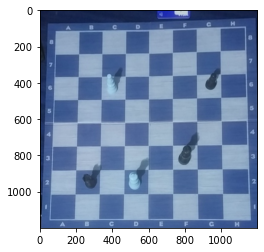

In [87]:
plt.imshow(img_crop)
plt.imsave("Analyzed.jpg", img_crop)

In [ ]:
print(four_points)
try: img.crop(four_points)
except:
    utils.warn("niestety, ale kolejna warstwa nie jest potrzebna")
    img.crop(inner_points)

print("\n")

POINTS: 42
LINES: 23
[[427, 404], [31, 443], [25, 104], [345, 95]]
POINTS: 45
LINES: 24
[[460, 54], [476, 482], [12, 488], [27, 48]]


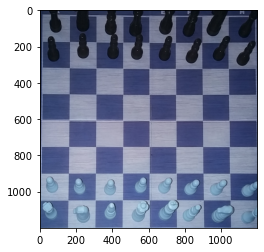

POINTS: 47
LINES: 27
[[424, 393], [56, 461], [18, 137], [323, 107]]
POINTS: 44
LINES: 23
[[457, 57], [472, 478], [15, 484], [31, 52]]


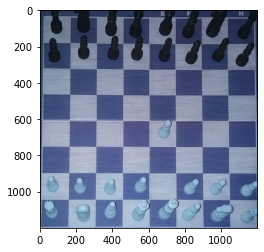

POINTS: 45
LINES: 21
[[424, 399], [42, 464], [14, 142], [318, 113]]
POINTS: 43
LINES: 25
[[454, 63], [474, 480], [11, 485], [31, 56]]


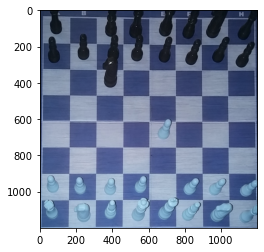

POINTS: 47
LINES: 25
[[428, 376], [45, 428], [19, 84], [347, 59]]
POINTS: 43
LINES: 21
[[464, 48], [478, 483], [14, 484], [27, 40]]


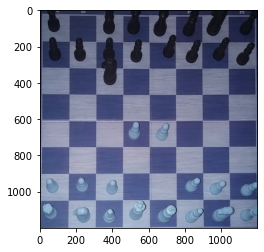

POINTS: 47
LINES: 26
[[427, 388], [31, 427], [26, 89], [349, 74]]
POINTS: 45
LINES: 24
[[465, 53], [477, 484], [13, 486], [29, 51]]


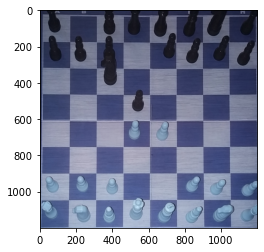

POINTS: 47
LINES: 26
[[416, 369], [68, 425], [31, 130], [318, 99]]
POINTS: 45
LINES: 26
[[455, 68], [469, 471], [22, 478], [39, 60]]


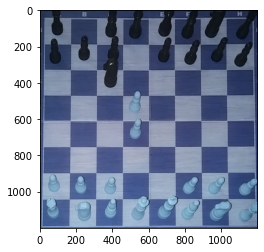

POINTS: 45
LINES: 28
[[442, 372], [86, 474], [8, 159], [306, 100]]
POINTS: 45
LINES: 23
[[453, 61], [469, 478], [15, 484], [30, 52]]


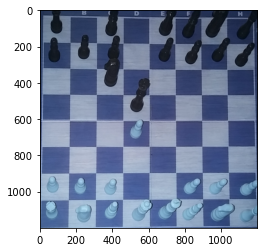

POINTS: 38
LINES: 27
[[436, 343], [101, 445], [13, 151], [299, 85]]
POINTS: 44
LINES: 26
[[452, 62], [465, 471], [20, 479], [36, 56]]


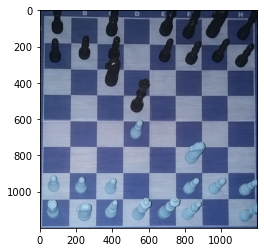

POINTS: 46
LINES: 26
[[433, 337], [74, 417], [18, 96], [329, 68]]
POINTS: 41
LINES: 30
[[466, 471], [12, 482], [25, 59], [450, 36]]


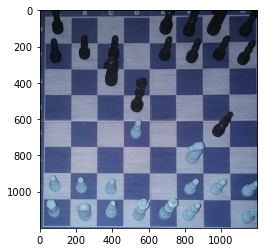

POINTS: 43
LINES: 26
[[427, 350], [59, 420], [15, 103], [323, 61]]
POINTS: 41
LINES: 27
[[460, 57], [474, 479], [16, 481], [32, 50]]


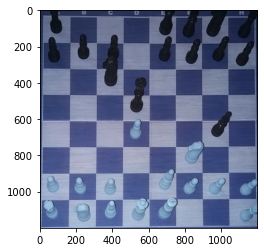

POINTS: 42
LINES: 26
[[415, 375], [36, 439], [1, 104], [318, 74]]
POINTS: 43
LINES: 24
[[461, 53], [475, 479], [13, 486], [26, 47]]


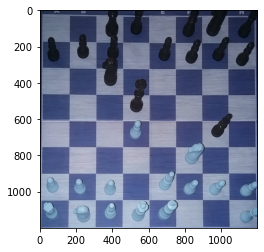

POINTS: 43
LINES: 25
[[423, 380], [36, 429], [18, 102], [333, 80]]
POINTS: 43
LINES: 23
[[461, 58], [475, 481], [11, 486], [29, 52]]


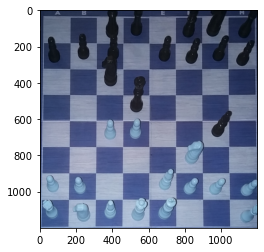

POINTS: 43
LINES: 24
[[421, 357], [27, 409], [14, 89], [324, 65]]
POINTS: 42
LINES: 24
[[462, 62], [477, 481], [12, 483], [31, 56]]


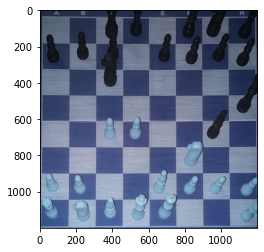

POINTS: 44
LINES: 23
[[425, 407], [45, 432], [45, 105], [359, 96]]
POINTS: 45
LINES: 28
[[463, 53], [477, 482], [17, 484], [32, 48]]


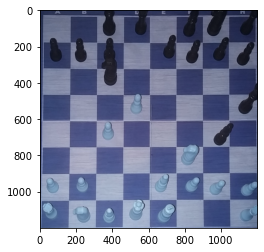

POINTS: 45
LINES: 25
[[417, 398], [23, 421], [29, 79], [358, 74]]
POINTS: 45
LINES: 25
[[467, 46], [481, 483], [13, 485], [30, 44]]


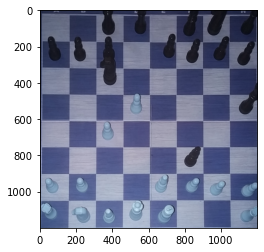

POINTS: 45
LINES: 24
[[415, 384], [26, 416], [26, 81], [348, 69]]
POINTS: 46
LINES: 22
[[465, 54], [479, 483], [15, 484], [30, 48]]


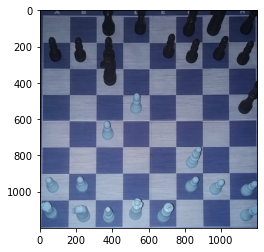

POINTS: 47
LINES: 25
[[424, 403], [49, 466], [24, 140], [330, 105]]
POINTS: 47
LINES: 23
[[459, 56], [475, 480], [17, 485], [31, 50]]


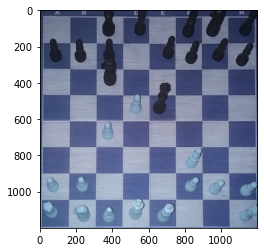

POINTS: 43
LINES: 23
[[424, 395], [40, 441], [25, 120], [331, 101]]
POINTS: 44
LINES: 22
[[461, 62], [475, 479], [14, 485], [33, 56]]


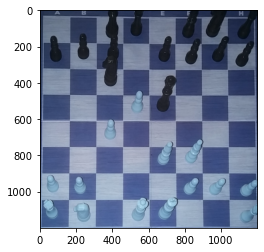

POINTS: 43
LINES: 23
[[426, 402], [28, 435], [29, 105], [345, 94]]
POINTS: 44
LINES: 22
[[463, 59], [478, 484], [11, 486], [31, 52]]


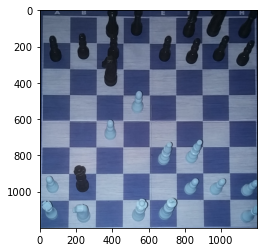

POINTS: 46
LINES: 26
[[413, 390], [33, 437], [27, 126], [329, 99]]
POINTS: 47
LINES: 23
[[461, 61], [476, 479], [15, 481], [35, 60]]


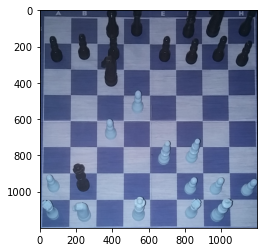

POINTS: 45
LINES: 25
[[413, 376], [35, 406], [36, 90], [344, 78]]
POINTS: 47
LINES: 21
[[461, 60], [477, 479], [16, 480], [32, 54]]


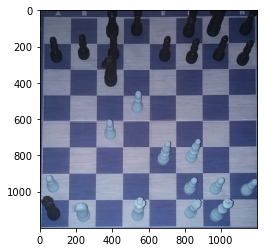

POINTS: 44
LINES: 22
[[422, 391], [41, 408], [51, 92], [359, 86]]
POINTS: 43
LINES: 22
[[461, 60], [477, 478], [18, 483], [33, 53]]


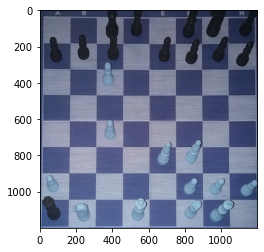

POINTS: 46
LINES: 25
[[406, 393], [19, 415], [35, 90], [353, 78]]
POINTS: 45
LINES: 21
[[465, 53], [481, 482], [18, 482], [32, 48]]


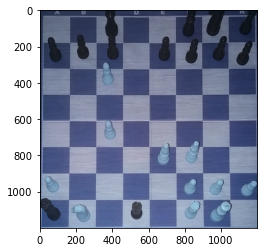

POINTS: 45
LINES: 23
[[425, 379], [59, 430], [35, 120], [336, 87]]
POINTS: 46
LINES: 23
[[461, 60], [475, 476], [18, 481], [37, 51]]


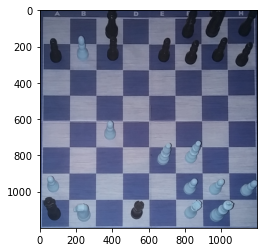

POINTS: 48
LINES: 23
[[348, 106], [425, 406], [41, 433], [36, 103]]
POINTS: 45
LINES: 21
[[458, 59], [473, 480], [12, 486], [32, 52]]


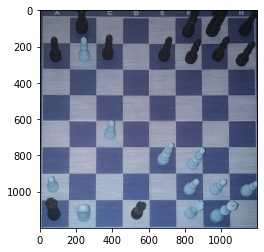

POINTS: 47
LINES: 22
[[417, 395], [21, 416], [34, 92], [346, 91]]
POINTS: 46
LINES: 21
[[460, 61], [476, 480], [13, 486], [32, 56]]


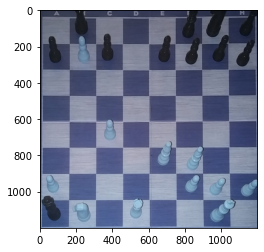

POINTS: 43
LINES: 22
[[425, 381], [48, 441], [20, 120], [325, 90]]
POINTS: 49
LINES: 22
[[459, 62], [474, 479], [15, 485], [31, 55]]


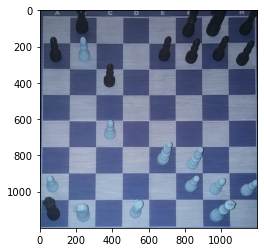

POINTS: 45
LINES: 24
[[413, 403], [22, 441], [22, 110], [336, 98]]
POINTS: 46
LINES: 21
[[461, 57], [479, 480], [14, 485], [29, 55]]


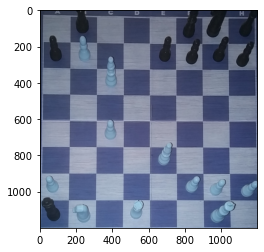

POINTS: 41
LINES: 24
[[440, 355], [91, 457], [12, 156], [301, 96]]
POINTS: 47
LINES: 24
[[451, 64], [467, 475], [17, 481], [33, 59]]


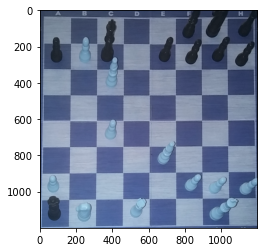

POINTS: 43
LINES: 23
[[428, 389], [49, 443], [23, 119], [332, 94]]
POINTS: 46
LINES: 21
[[461, 60], [476, 479], [16, 485], [32, 51]]


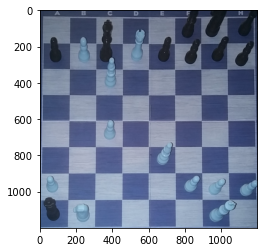

POINTS: 48
LINES: 22
[[422, 411], [30, 455], [24, 101], [330, 78]]
POINTS: 45
LINES: 22
[[462, 95], [477, 488], [15, 494], [34, 86]]


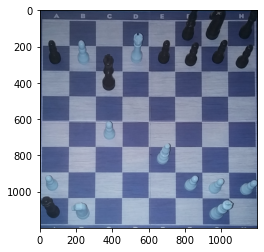

POINTS: 47
LINES: 25
[[417, 445], [39, 463], [55, 141], [361, 137]]
POINTS: 48
LINES: 21
[[457, 57], [478, 480], [19, 482], [33, 51]]


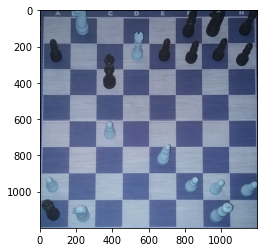

Done!


In [2]:
%matplotlib inline 

import numpy as np
import cv2
from matplotlib import pyplot as plt
import glob

from rescale import *
from slid import detect_lines
from laps import LAPS
from llr import LLR, llr_pad


# path = "/Users/rizo/Dropbox/chess/1.jpg"
# src = cv2.imread(path)
# src = cv2.cvtColor(src,cv2.COLOR_BGR2GRAY)
img_filename_list = []
folder_name = '/Users/rizo/Dropbox/chess/*'
for path_name in glob.glob(folder_name):
    img_filename_list.append(path_name)  
# print(img_filename_list)
i = 0
skipped = 0
img_filename_list.sort(key= lambda s : int(s.split('/')[-1].split('.')[0]))
for path in img_filename_list:
    i += 1
# path = "/Users/rizo/Dropbox/chess/light.jpg"
# path = '/Users/rizo/Dropbo    x/chess/1.jpg'
    src = cv2.imread(path)
    img_cropped = src.copy()
    for _ in range(2):
        # src = cv2.Canny(src, 150, 200, None, 3)
        img, shape, scale = image_resize(img_cropped)
        lines = detect_lines(img)
        # filter_lines(lines)
        lattice_points = LAPS(img, lines)
        try: 
            inner_points = LLR(img, lattice_points, lines)
            four_points = llr_pad(inner_points, img) # padcrop

            print(four_points)
            try: img_cropped = crop(img_cropped, four_points, scale)
            except:
                print("WARNING: too much cropping")
                img_cropped = crop(img_cropped, inner_points, scale)

            
        except:
            print("Skipped")
            skipped += 1
    plt.imshow(img_cropped)
    # plt.imsave("test_data/%i.png" % i, img_cropped)
    plt.show()
print("Done!")  

# img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
# segments = pSLID(src)
# segments = []
# raw_lines = SLID(src, segments)
# lines = slid_tendency(raw_lines)
# img = src.copy()
# for l in lines:
#     img = cv2.line(img, tuple(l[0]), tuple(l[1]), (255,0,0), 1)
# plt.imshow(img)
# plt.savefig("ASD", dpi=300)


In [177]:
plt.imsave("FirstSuccess.jpg", img_cropped)

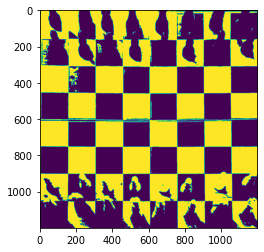

In [179]:
asd = cv2.imread("FirstSuccess.jpg", 0)
blur = cv2.GaussianBlur(asd,(5,5),0)
_, img_binary = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(img_binary)

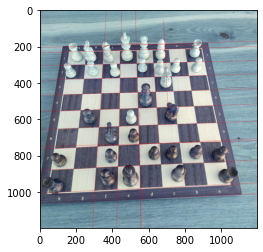

In [262]:
path = '/Users/rizo/Dropbox/chess/side.jpeg'
# path = "FirstSuccess.jpg"
imd = cv2.imread(path)
pLines = detect_lines(imd)

# pregroup = [[],[]]
# # inds = {}
# # intersects = {}
# all_lines = {}

# for i in range(len(pLines)):
#     line = pLines[i]
#     h = hash(str(line))
#     # intersects[h] = 0
#     # inds[h] = i
#     all_lines[h] = line


# for line in pLines:
#     m = slope(line)
#     if abs(m) < 1:
#         pregroup[0].append(line)
#     else:
#         pregroup[1].append(line)

# S = [set(), set()]
# headers = {}
# for i in range(2):
#     pg = pregroup[i]
#     for line1 in pg:
#         h1 = hash(str(line1))
#         found = False
#         for header in S[i]:
#             h_list = headers[header]
#             h2 = h_list[0]
#             line2 = all_lines[h2]
#             if angle(line1, line2) < 20:
#                 found = True
#                 headers[h2].append(h1)
#                 break
#         if not found:
#             headers[h1] = [h1]
#             S[i].add(h1)

# # print(S)

# for i in range(2):
#     for header in S[i]:
#         h_list = headers[header]
#         if len(h_list) < 6:
#             for i in range(len(pLines)-1, -1, -1):
#                 if hash(str(pLines[i])) in h_list:
#                     del pLines[i]

for i in range(len(pLines)-1, -1, -1):
    if 0.25 < abs(slope(pLines[i])) < 15:
        del pLines[i]

for line in pLines:
    pt1, pt2 = line
    imd = cv2.line(imd, (pt1[0], pt1[1]), (pt2[0], pt2[1]), (255,0,0), 1)
# filter_lines(pLines, 20)
plt.imshow(imd)
plt.imsave("AWE1.png", imd)

In [195]:
N

150

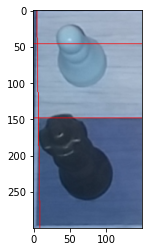

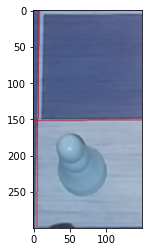

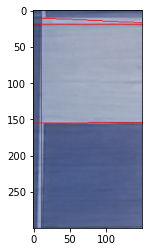

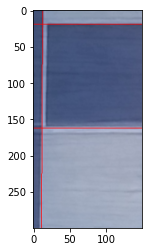

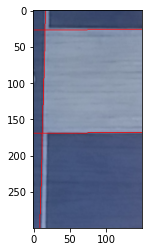

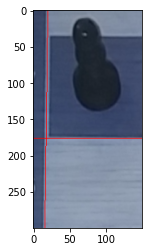

error: OpenCV(4.2.0) /Users/travis/build/skvark/opencv-python/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [368]:
imd = img_cropped
imheight, imwidth, _ = imd.shape

M = imheight //8
N = imwidth // 8
for x in range(0, imwidth, N):
    for y in range(imheight-1, M-1, -M):
        sub_img = imd[y-2*M:y, x:x+N].copy()
        sub_lines = detect_lines(sub_img)
        sub_img = plot_lines(sub_img, sub_lines)
        plt.imshow(sub_img)
        plt.show()

In [143]:
def filter_lines(lines, theta=30):
    pregroup = [[],[]]
    all_lines = {}

    for i in range(len(lines)):
        line = lines[i]
        h = hash(str(line))
        all_lines[h] = line


    for line in lines:
        m = slope(line)
        if abs(m) < 1:
            pregroup[0].append(line)
        else:
            pregroup[1].append(line)

    S = [set(), set()]
    headers = {}
    for i in range(2):
        pg = pregroup[i]
        for line1 in pg:
            h1 = hash(str(line1))
            found = False
            for header in S[i]:
                h_list = headers[header]
                h2 = h_list[0]
                line2 = all_lines[h2]
                if angle(line1, line2) < theta:
                    found = True
                    headers[h2].append(h1)
                    break
            if not found:
                headers[h1] = [h1]
                S[i].add(h1)



    for i in range(2):
        for header in S[i]:
            h_list = headers[header]
            if len(h_list) < 6:
                for i in range(len(pLines)-1, -1, -1):
                    if hash(str(pLines[i])) in h_list:
                        del pLines[i]

    # Since not all lines are filtered, we compared angles between the two 
    # pregroups: all the "good" lines should form angles close to pi/2
    

In [113]:
pLines

[[[478, 329], [540, -163]],
 [[695, 369], [857, -256]],
 [[986, 192], [1556, 192]],
 [[-1384, 1028], [5033, 1210]],
 [[111, 597], [248, -153]],
 [[-1657, 173], [5098, 523]],
 [[827, -2099], [1222, 6406]],
 [[790, -2169], [897, 6493]],
 [[-3033, 987], [8509, 1312]],
 [[411, 3405], [893, -5295]],
 [[635, 3417], [822, -5283]],
 [[-2330, 862], [7225, 1149]],
 [[-2556, 715], [7474, 1060]],
 [[-2587, 2], [7318, 509]],
 [[909, -2047], [1871, 6365]],
 [[184, 3432], [954, -5255]],
 [[-2429, 349], [7163, 786]],
 [[-1691, 1106], [4614, 1238]],
 [[-39, 3365], [1023, -5240]],
 [[-2383, 240], [7229, 710]],
 [[-137, 2032], [425, -1155]],
 [[942, -1958], [1962, 6067]],
 [[965, 534], [1140, -396]],
 [[-1801, 72], [5974, 472]],
 [[-2619, 584], [7561, 966]],
 [[-301, 3464], [1104, -5166]],
 [[948, -1722], [1743, 5453]],
 [[865, -2110], [1540, 6457]],
 [[531, 1161], [568, 698]],
 [[-2682, 454], [8030, 916]],
 [[892, -92], [899, 838]],
 [[14, 561], [601, 598]],
 [[902, 15], [1627, 35]],
 [[405, -41], [530,

In [68]:
shape = imd.shape
shape

(1273, 1429, 3)

In [24]:

def slope(line):
    a, b = line
    if a[0] == b[0]:
        return np.inf
    else:
        slope = (b[1]-a[1])/(b[0]-a[0])
        return slope

def y_intercept(line):
    a, b = line
    if a[0] == b[0]:
        return (a[1] + b[1])/2
    else:
        return (a[1]*b[0]-a[0]*b[1])/(b[0]-a[0])

def belongs(pt, line):
    a, b = line
    return a[0] < pt[0] < b[0] and a[1] < pt[1] < b[1]

def extend(line):
    m = slope(line)
    b = y_intercept(line)
    if abs(m) < 1:
        pt1 = [0, int(b)]
        x = shape[1]-1
        pt2 = [int(x), int(m*x+b)]
    else:
        pt1 = [int(-b/m), 0]
        y = shape[0]-1
        pt2 = [int((y-b)/m), int(y)]
        if m < 0:
            pt1, pt2 = pt2, pt1
    return [pt1, pt2]


def intersect(line1, line2):
    m1 = slope(line1)
    m2 = slope(line2)
    b1 = y_intercept(line1)
    b2 = y_intercept(line2)
    if m1 == m2:
        return False
    x_cross = (b2-b1)/(m1-m2)
    y_cross = (m1*b2-m2*b1)/(m1-m2)
    pt = (x_cross, y_cross)
    return belongs(pt, line1) and belongs(pt, line2)

# def angle(line1, line2):
#     '''Assuming lines are in the same pregroup (i.e. not perpendicular)'''
#     m1 = slope(line1)
#     m2 = slope(line2)
#     return np.arctan(abs(m1-m2)/(1+m1*m2)) * 180 / np.pi

def angle(line1, line2):
    x1 = line1[1][0] - line1[0][0]
    y1 = line1[1][1] - line1[0][1]
    x2 = line2[1][0] - line2[0][0]
    y2 = line2[1][1] - line2[0][1]
    inner_product = x1*x2 + y1*y2
    len1 = math.hypot(x1, y1)
    len2 = math.hypot(x2, y2)
    return math.acos(inner_product/(len1*len2)) * 180 / np.pi

In [43]:

slopes = []
for line in pLines:
    a, b = line
    if a[0] == b[0]:
        slopes.append(np.inf)
    else:
        slope = (b[1]-a[1])/(b[0]-a[0])
        slopes.append(np.round(slope, 3))
slopes.sort()
print(slopes)


[-46.524, -18.05, -12.514, -11.282, -8.103, -7.935, -6.142, -5.671, -5.474, -5.314, -3.858, -2.401, -2.055, -2.025, 0.0, 0.021, 0.028, 0.028, 0.028, 0.03, 0.034, 0.038, 0.043, 0.046, 0.049, 0.051, 0.051, 0.052, 0.063, 0.29, 1.0, 2.041, 5.64, 7.868, 8.744, 9.025, 12.692, 21.532, 80.953, 132.857]


In [26]:
a, b = pLines[0]
slope = (b[1]-a[1])/(b[0]-a[0])
slope

-9.24

In [100]:
math.acos(0.5)*180/np.pi

59.99999999999999

In [4]:
# My implementation of the SLID module from
# https://github.com/maciejczyzewski/neural-chessboard/

from typing import Tuple
import numpy as np
import cv2


arr = np.array
# Four parameters are taken from the original code and
# correspond to four possible cases that need correction:
# low light, overexposure, underexposure, and blur
CLAHE_PARAMS = [[3,   (2, 6),    5],  # @1
                [3,   (6, 2),    5],  # @2
                [5,   (3, 3),    5],  # @3
                [0,   (0, 0),    0]]  # EE


def slid_clahe(img, limit=2, grid=(3, 3), iters=5):
    """repair using CLAHE algorithm (adaptive histogram equalization)"""
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    for i in range(iters):
        img = cv2.createCLAHE(clipLimit=limit,
                              tileGridSize=grid).apply(img)
    if limit != 0:
        kernel = np.ones((10, 10), np.uint8)
        img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    return img


def slid_detector(img, alfa=150, beta=2):
    """detect lines using Hough algorithm"""
    __lines, lines = [], cv2.HoughLinesP(img, rho=1, theta=np.pi/360*beta,
                                         threshold=40, minLineLength=50, maxLineGap=15)  # [40, 40, 10]
    if lines is None:
        return []
    for line in np.reshape(lines, (-1, 4)):
        __lines += [[[int(line[0]), int(line[1])],
                     [int(line[2]), int(line[3])]]]
    return __lines


def slid_canny(img, sigma=0.25):
    """apply Canny edge detector (automatic thresh)"""
    v = np.median(img)
    img = cv2.medianBlur(img, 5)
    img = cv2.GaussianBlur(img, (7, 7), 2)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    return cv2.Canny(img, lower, upper)


def pSLID(img, thresh=150):
    """find all lines using different settings"""
    segments = []
    i = 0
    for key, arr in enumerate(CLAHE_PARAMS):
        tmp = slid_clahe(img, limit=arr[0], grid=arr[1], iters=arr[2])
        curr_segments = list(slid_detector(slid_canny(tmp), thresh))
        segments += curr_segments
        i += 1
        # print("FILTER: {} {} : {}".format(i, arr, len(curr_segments)))
    return segments


all_points = []


def SLID(img, segments):
    global all_points
    all_points = []

    pregroup, group, hashmap, raw_lines = [[], []], {}, {}, []

    dists = {}

    def dist(a, b):
        h = hash("dist"+str(a)+str(b))
        if h not in dists:
            dists[h] = np.linalg.norm(arr(a)-arr(b))
        return dists[h]

    parents = {}

    def find(x):
        if x not in parents:
            parents[x] = x
        if parents[x] != x:
            parents[x] = find(parents[x])
        return parents[x]

    def union(a, b):
        par_a = find(a)
        par_b = find(b)
        parents[par_a] = par_b
        group[par_b] |= group[par_a]

    def height(line, pt):
        v = np.cross(arr(line[1])-arr(line[0]), arr(pt)-arr(line[0]))
        # Using dist() to speed up distance look-up since the 2-norm
        # is used many times
        return np.linalg.norm(v)/dist(line[1], line[0])

    def are_similar(l1, l2):
        '''See Sec.3.2.2 in Czyzewski et al.'''
        a = dist(l1[0], l1[1])
        b = dist(l2[0], l2[1])

        x1 = height(l2, l1[0])
        x2 = height(l2, l1[1])
        y1 = height(l1, l2[0])
        y2 = height(l1, l2[1])

        if x1 < 1e-8 and x2 < 1e-8 and y1 < 1e-8 and y2 < 1e-8:
            return True

        # print("l1: %s, l2: %s" % (str(l1), str(l2)))
        # print("x1: %f, x2: %f, y1: %f, y2: %f" % (x1, x2, y1, y2))
        gamma = 0.25 * (x1+x2+y1+y2)
        # print("gamma:", gamma)

        img_width = 500
        img_height = 282
        p = 0.
        A = img_width*img_height
        w = np.pi/2 / np.sqrt(np.sqrt(A))
        t_delta = p*w
        t_delta = 0.0625
        # t_delta = 0.05

        delta = (a+b) * t_delta

        return (a/gamma > delta) and (b/gamma > delta)

    def generate_line(a, b, n):
        points = []
        for i in range(n):
            x = a[0] + (b[0] - a[0]) * (i/n)
            y = a[1] + (b[1] - a[1]) * (i/n)
            points += [[int(x), int(y)]]
        return points

    def analyze(group):
        global all_points
        points = []
        for idx in group:
            points += generate_line(*hashmap[idx], 10)
        _, radius = cv2.minEnclosingCircle(arr(points))
        w = radius * np.pi / 2
        vx, vy, cx, cy = cv2.fitLine(arr(points), cv2.DIST_L2, 0, 0.01, 0.01)
        all_points += points
        return [[int(cx-vx*w), int(cy-vy*w)], [int(cx+vx*w), int(cy+vy*w)]]

    for l in segments:
        h = hash(str(l))
        # Initialize the line
        hashmap[h] = l
        group[h] = set([h])
        parents[h] = h

        wid = l[0][0] - l[1][0]
        hei = l[0][1] - l[1][1]

        # Divide lines into more horizontal vs more vertical
        # to speed up comparison later
        if abs(wid) < abs(hei):
            pregroup[0].append(l)
        else:
            pregroup[1].append(l)

    for lines in pregroup:
        for i in range(len(lines)):
            l1 = lines[i]
            h1 = hash(str(l1))
            # We're looking for the root line of each disjoint set
            if parents[h1] != h1:
                continue
            for j in range(i+1, len(lines)):
                l2 = lines[j]
                h2 = hash(str(l2))
                if parents[h2] != h2:
                    continue
                if are_similar(l1, l2):
                    # Merge lines into a single disjoint set
                    union(h1, h2)

    for h in group:
        if parents[h] != h:
            continue
        raw_lines += [analyze(group[h])]

    return raw_lines


def slid_tendency(raw_lines, s=4):
    lines = []
    def scale(x, y, s): return int(x * (1+s)/2 + y * (1-s)/2)
    for a, b in raw_lines:
        a[0] = scale(a[0], b[0], s)
        a[1] = scale(a[1], b[1], s)
        b[0] = scale(b[0], a[0], s)
        b[1] = scale(b[1], a[1], s)
        lines += [[a, b]]
    return lines


def detect_lines(img):
    segments = pSLID(img)
    raw_lines = SLID(img, segments)
    lines = slid_tendency(raw_lines)
    return lines


In [24]:
pLines = detect_lines(imd)
for line in pLines:
    

[[[732, 1168], [744, 293]],
 [[54, 1586], [329, 98]],
 [[1183, 202], [1290, 664]],
 [[-141, 1441], [471, 1441]],
 [[499, 427], [644, -78]],
 [[51, 2335], [333, 460]],
 [[-119, 2145], [336, 1677]],
 [[-131, 1831], [481, 1218]],
 [[1515, 1694], [1540, 1189]],
 [[1103, 1083], [1540, 1128]],
 [[54, 2247], [299, 579]],
 [[1192, 97], [1724, 317]],
 [[547, 301], [1067, 326]],
 [[1062, -957], [1657, 4343]],
 [[731, 1713], [781, -1054]],
 [[-2580, 1118], [7320, 1338]],
 [[1505, 1338], [1512, 1958]],
 [[-185, 3177], [1065, -4665]],
 [[1166, -92], [1523, 3058]],
 [[27, 1880], [164, 1380]],
 [[-121, 1998], [629, 1248]],
 [[1156, 120], [1726, 282]],
 [[-189, 2492], [711, 442]],
 [[1483, 1367], [1608, 2442]],
 [[21, 1817], [58, 1112]],
 [[-87, 1462], [380, 1462]],
 [[-109, 1961], [478, 1106]],
 [[107, 1355], [289, 2405]],
 [[78, 1476], [148, 1976]],
 [[-2392, 3762], [6233, -3513]],
 [[-197, 2647], [795, -140]],
 [[792, 1204], [1229, 811]],
 [[-147, 1912], [553, 1044]],
 [[292, 431], [349, -124]],
 [

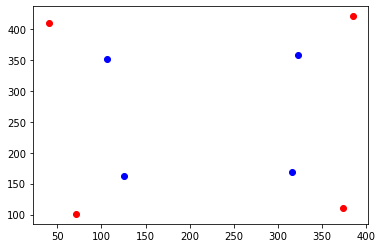

In [18]:
for pt in four_points:
    plt.scatter(pt[0], pt[1], c='r')
for pt in inner_points:
    plt.scatter(pt[0], pt[1], c='b')
    

In [3]:
3 == 3 == 3

True

[[601, 0], [601, 1199]] 1199.0 600.0
[[612, 405], [612, 905]] 500.0 600.0


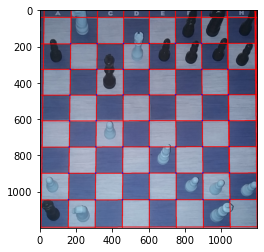

In [101]:
%matplotlib inline 

import numpy as np
import cv2
from matplotlib import pyplot as plt
import glob

from rescale import *
from slid import detect_lines
from laps import LAPS
from llr import LLR, llr_pad

def plot_lines(src, lines, thickness=1):
    img = src.copy()
    for l in lines:
        img = cv2.line(img, tuple(l[0]), tuple(l[1]), (255,0,0), thickness)
    return img

img_filename_list = []
folder_name = '/Users/rizo/Dropbox/chess/*'
for path_name in glob.glob(folder_name):
    img_filename_list.append(path_name)  
i = 1
skipped = 0
# path = "/Users/rizo/Dropbox/chess/4.jpg"
# img = cv2.imread(path)
img = img_cropped.copy()
lines = detect_lines(img)
# filter_lines(lines)


for i in range(len(lines)-1, -1, -1):
    if 0.2 < abs(slope(lines[i])) < 10:
        del lines[i]


# for pg in pregroup:
#     intersects = [0]*len(pg)
#     for i in range(len(pg)):
#         for j in range(i+1, len(pg)):
#             line1 = pg[i]
#             line2 = pg[j]

# for pg in pregroup: 
#     avg_len = avg_line_length(pg)
#     for i in range(len(pg)-1, -1, -1):
#         if dist(line) < avg_len:
#             del pg[i]


# lines = pregroup[0] + pregroup[1]

# for line in lines:
#     crop_line(line, img.shape)

# for line in lines:
#     for pt in line:
#         img = cv2.circle(img, (int(pt[0]), int(pt[1])), 6, (0,0,255), -1)

lines = filter_lines_new(lines)

points = LAPS(img, lines)

min_x, max_x, min_y, max_y = 1e5, 0, 1e5, 0
for pt in points:
    if pt[0] < min_x:
        min_x = pt[0]
    elif pt[0] > max_x:
        max_x = pt[0]
    if pt[1] < min_y:
        min_y = pt[1]
    elif pt[1] > max_y:
        max_y = pt[1]

pregroup = [[],[]]
for line in lines:
    m = slope(line)
    if m < 1:
        pregroup[0].append(line)
    else:
        pregroup[1].append(line)

def find_intersection(line1, line2):
    m1 = slope(line1)
    m2 = slope(line2)
    b1 = y_intercept(line1)
    b2 = y_intercept(line2)
    if m1 == m2:
        return None
    x_cross = (b2-b1)/(m1-m2)
    y_cross = (m1*b2-m2*b1)/(m1-m2)
    pt = (x_cross, y_cross)
    return pt

for i in range(len(pg[0])):
    for j in range(len(pg[1])):
        line1, line2 = pg[i], pg[j]
        if intersect(line1, line2):
            

img = plot_lines(img, lines, 3) 
# for pt in points:
#     img = cv2.circle(img, (int(pt[0]), int(pt[1])), 6, (0,0,255), -1)
# for point in points:
#     x, y = point
#     x, y = int(x), int(y)
#     while y < img.shape[0]:
#         img = cv2.circle(img, (x, y), 6, (0,0,255), -1)
#         y += round(meanDist)
#     x, y = point
#     x, y = int(x), int(y)
#     while x < img.shape[1]:
#         img = cv2.circle(img, (x, y), 6, (0,0,255), -1)
#         x += round(meanDist)
img = plot_points(img, points, 4)

# for line in lines:
#     for pt in line:
#         img = cv2.circle(img, (int(pt[0]), int(pt[1])), 6, (0,255,255), -1)

plt.imshow(img)
plt.imsave("Net.png", img)

In [100]:
points

[(156.0, 1044.0),
 (158.0, 898.0),
 (160.0, 752.0),
 (162.0, 610.0),
 (164.0, 468.0),
 (166.0, 326.0),
 (168.0, 184.5),
 (305.0, 1044.0),
 (306.5, 897.0),
 (307.5, 753.0),
 (309.0, 609.0),
 (310.5, 467.0),
 (311.5, 326.0),
 (312.6666666666667, 185.66666666666666),
 (453.0, 1044.0),
 (454.0, 897.0),
 (455.0, 753.0),
 (457.0, 467.0),
 (458.0, 326.0),
 (459.0, 187.0),
 (601.0, 184.0),
 (601.0, 326.0),
 (601.0, 467.0),
 (601.0, 608.0),
 (601.0, 752.0),
 (601.0, 897.0),
 (601.0, 1044.0),
 (745.0, 183.0),
 (746.0, 466.0),
 (747.0, 606.0),
 (747.0, 752.0),
 (748.0, 897.0),
 (749.0, 1043.0),
 (889.0, 183.0),
 (890.0, 326.0),
 (891.0, 466.0),
 (893.0, 608.0),
 (894.0, 752.0),
 (896.0, 896.0),
 (897.0, 1043.0),
 (1033.0, 326.0),
 (1036.0, 466.0),
 (1039.0, 608.0),
 (1041.0, 753.0),
 (1043.0, 896.0),
 (1044.0, 1043.0)]

In [91]:
np.inf - np.inf

nan

In [98]:
def filter_lines_new(lines):
    for i in range(len(lines)-1, -1, -1):
        if 0.1 < abs(slope(lines[i])) < 20:
            del lines[i]

    pregroup = [[],[]]
    for line in lines:
        if abs(slope(line)) < 1:
            pregroup[0].append(line)
        else:
            pregroup[1].append(line)

    for count in range(2):
        pg = pregroup[count]
        flag = False
        i = 0
        while True:
            if i >= len(pg):
                break
            for j in range(len(pg)-1, i, -1):
                if intersect(pg[i], pg[j]):
                    m1 = slope(pg[i])
                    m2 = slope(pg[j])
                    # TODO: If two parallel lines intersect, add abs(m1-m2) < epsilon
                    if abs(m1) < abs(m2):
                        del pg[j]
                    else:
                        flag = True
                        del pg[i]
                        break
            if not flag:
                i += 1
            flag = False

    lines = pregroup[0] + pregroup[1]

    for i in range(len(lines)-1, -1, -1):
        line = [lines[i][0].copy(), lines[i][1].copy()]
        m = slope(line)
        crop_line(line, img.shape)
        if (abs(m) < 1 and dist(line) < img.shape[1]/2) or (abs(m) > 10 and dist(line) < img.shape[0]/2):
            del lines[i]
        if abs(m) == np.inf:
            print(line, dist(line), img.shape[0]/2)
    
    return lines

In [88]:
img.shape

(1200, 1200, 3)

In [72]:
for line in lines:
    print(line, abs(slope(line)), round(dist(line)))

[[-3004, 475], [8401, 450]] 0.0021920210434020165 11405
[[-2641, 1200], [7396, 1182]] 0.0017933645511607054 10037
[[-2873, 326], [8094, 326]] 0.0 10967
[[-2999, 615], [8413, 597]] 0.0015772870662460567 11412
[[-2967, 1050], [8138, 1032]] 0.0016208914903196759 11105
[[-2922, 38], [7978, 45]] 0.0006422018348623853 10900
[[-3100, 761], [8362, 736]] 0.002181120223346711 11462
[[-2824, 194], [7851, 164]] 0.002810304449648712 10675
[[-3006, 903], [8461, 885]] 0.001569721810412488 11467
[[1176, -926], [1221, 2699]] 80.55555555555556 3625
[[7, 1014], [2, 1496]] 96.4 482
[[1181, -243], [1181, 899]] inf 1142
[[612, 405], [612, 905]] inf 500
[[291, 2964], [353, -4941]] 127.5 7905
[[-38, 4116], [124, -6939]] 68.24074074074075 11056
[[434, 4237], [504, -6938]] 159.64285714285714 11175
[[860, -2860], [967, 8265]] 103.97196261682242 11126
[[601, 4220], [601, -7122]] inf 11342
[[733, -2928], [778, 8159]] 246.37777777777777 11087
[[114, 4195], [264, -6835]] 73.53333333333333 11031
[[286, 2603], [348, -

In [46]:
def ccw(A,B,C):
    return (C[1]-A[1]) * (B[0]-A[0]) > (B[1]-A[1]) * (C[0]-A[0])

# Return true if line segments AB and CD intersect
def intersect(line1, line2):
    A, B = line1
    C, D = line2
    return ccw(A,C,D) != ccw(B,C,D) and ccw(A,B,C) != ccw(A,B,D)

pregroup = [[],[]]
for line in lines:
    if slope(line) < 1:
        pregroup[0].append(line)
    else:
        pregroup[1].append(line)

pg = pregroup[0]
i = 0
flag = False
while True:
    # print(i)
    if i >= len(pg):
        break
    for j in range(len(pg)-1, i, -1):
        if intersect(pg[i], pg[j]):
            if abs(slope(pg[i])) < abs(slope(pg[j])):
                del pg[j]
            else:
                flag = True
                del pg[i]
                break
    if not flag:
        i += 1
    flag = False

0 14
0 13
0 18
0 17
0 16
0 13
0 9
0 7
1 14
1 10
1 10
1 11
5 9


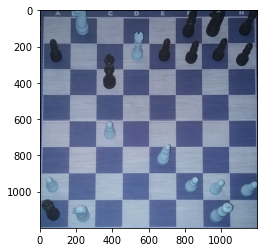

In [28]:
plt.imshow(img_cropped)

In [23]:
def plot_lines(src, lines, thickness=1):
    img = src.copy()
    for l in lines:
        img = cv2.line(img, tuple(l[0]), tuple(l[1]), (255,0,0), thickness)
    return img

def plot_points(src, points, size=1):
    img = src.copy()
    for pt in points:
        img = cv2.circle(img, (int(pt[0]), int(pt[1])), size, (0,0,255), -1)
    return img

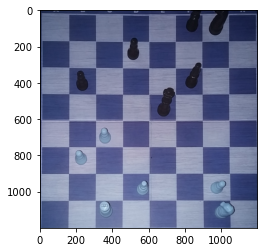

In [318]:
plt.imshow(img_cropped)

In [29]:
dists = []
meanDist = 0
for i in range(len(points)):
    for j in range(i+1, len(points)):
        if len(dists) > 0:
            meanDist = sum(dists)/len(dists)
        pt1 = points[i]
        pt2 = points[j]
        if pt1[0] == pt2[0]:
            dist = int(abs(pt2[1]-pt1[1]))
            if meanDist != 0 and abs(dist - meanDist) > 5:
                continue
            dists.append(dist)
        elif pt1[1] == pt2[1]:
            dist = int(abs(pt2[0]-pt1[0]))
            if meanDist != 0 and abs(dist - meanDist) > 5:
                continue
            dists.append(dist)

In [312]:
round(147.8)

148

In [76]:
def angle_slopes(m1, m2):
    # Angles between the lines and the x-axis
    A = np.arctan(m1) * 180/np.pi
    B = np.arctan(m2) * 180/np.pi
    return abs(A-B)

def crop_line(line, shape):
    pt1, pt2 = line
    m = slope(line)
    b = y_intercept(line)

    if pt1[0] < 0 or pt1[1] < 0 or pt1[1] > shape[0]:
        if m == np.inf:
            pt1[1] = 0
            pt2[1] = shape[0]-1
            return
            
        x = 0
        while x < shape[1] and (m*x+b < 0 or m*x+b > shape[0]):
            x += 1
        if x >= shape[1]:
            raise ValueError('Line completely outside of boundaries!')
        pt1[0] = int(x)
        pt1[1] = int(m*x+b)

    if pt2[0] >= shape[1] or pt2[1] < 0 or pt2[1] > shape[0]:
        if m == np.inf:
            pt1[1] = 0
            pt2[1] = shape[0]-1
            return
        x = shape[1]-1
        while x >= 0 and (m*x+b < 0 or m*x+b > shape[0]):
            x -= 1
        if x < 0:
            raise ValueError('Line completely outside of boundaries!')
        pt2[0] = int(x)
        pt2[1] = int(m*x+b)
    # 
    # return [pt1, pt2]
        
def dist(line):
    return np.sqrt((line[0][0]-line[1][0])**2 + (line[0][1]-line[1][1])**2)

def avg_line_length(lines):
    total = 0
    for line in lines:
        total += dist(line)
    return total/len(lines)


In [212]:
angle_slopes(0,1e8)

89.9999994270422

In [334]:
import os, glob
import chess.pgn

# read the game file and set board
pgn = open("runau_schmidt_1972.pgn")
game = chess.pgn.read_game(pgn)
board = game.board()

# read chessboard image at move x, jump board to move x
# filename = "move_x.jpg"
# move = game.mainline_moves()
# board.push(move)

# for i in range(64):
#     piece = board.piece_at(i)
#     if piece is None:
#         # save image with empty label
#     else:
#         # save image with piece.symbol() label


In [341]:
game.mainline_moves()

<Mainline at 0x158e45a00 (1. e4 Nc6 2. d4 d5 3. exd5 Qxd5 4. Nf3 Bg4 5. Be2 O-O-O 6. c4 Qh5 7. d5 Bxf3 8. Bxf3 Qe5+ 9. Be3 Qxb2 10. O-O Qxa1 11. dxc6 Rxd1 12. cxb7+ Kb8 13. Rxd1 c6 14. Bxc6 Kc7 15. Rd7+ Kxc6 16. b8=N#)>

In [322]:
pgn = open("runau_schmidt_1972.pgn")
game = chess.pgn.read_game(pgn)
board = game.board()

for i in range(1, 33):
    # read chessboard image at move x, jump board to move x
    filename = "move_x.jpg"
    move = game.mainline_moves()
    board.push(move)

    for i in range(64):
        piece = board.piece_at(i)
        if piece is None:
            # save image with empty label
            
        else:
            # save image with piece.symbol() label

In [359]:
import os

img_filename_list = []
folder_name = '/Users/rizo/Dropbox/chess/*'

for path_name in glob.glob(folder_name):
    img_filename_list.append(path_name)
img_filename_list.sort()

i = 1
for path_name in img_filename_list:
    os.rename(path_name, '/Users/rizo/Dropbox/chess/%i.jpg' % i)
    i += 1
print(img_filename_list)
# print(img_filename_list)
# i = 1
# skipped = 0
# # for path in img_filename_list:
# path = "/Users/rizo/Dropbox/chess/light.jpg"

['/Users/rizo/Dropbox/chess/20210822_013135.jpg', '/Users/rizo/Dropbox/chess/20210822_013141.jpg', '/Users/rizo/Dropbox/chess/20210822_013148.jpg', '/Users/rizo/Dropbox/chess/20210822_013155.jpg', '/Users/rizo/Dropbox/chess/20210822_013202.jpg', '/Users/rizo/Dropbox/chess/20210822_013213.jpg', '/Users/rizo/Dropbox/chess/20210822_013222.jpg', '/Users/rizo/Dropbox/chess/20210822_013256.jpg', '/Users/rizo/Dropbox/chess/20210822_013306.jpg', '/Users/rizo/Dropbox/chess/20210822_013313.jpg', '/Users/rizo/Dropbox/chess/20210822_013348.jpg', '/Users/rizo/Dropbox/chess/20210822_013400.jpg', '/Users/rizo/Dropbox/chess/20210822_013510.jpg', '/Users/rizo/Dropbox/chess/20210822_013613.jpg', '/Users/rizo/Dropbox/chess/20210822_013622.jpg', '/Users/rizo/Dropbox/chess/20210822_013633.jpg', '/Users/rizo/Dropbox/chess/20210822_013642.jpg', '/Users/rizo/Dropbox/chess/20210822_013653.jpg', '/Users/rizo/Dropbox/chess/20210822_013702.jpg', '/Users/rizo/Dropbox/chess/20210822_013912.jpg', '/Users/rizo/Dropbo

In [352]:
img_filename_list.sort(key= lambda s : int(s.split('/')[-1].split('.')[0]))
img_filename_list

['/Users/rizo/Dropbox/chess/1.jpg',
 '/Users/rizo/Dropbox/chess/2.jpg',
 '/Users/rizo/Dropbox/chess/3.jpg',
 '/Users/rizo/Dropbox/chess/4.jpg',
 '/Users/rizo/Dropbox/chess/5.jpg',
 '/Users/rizo/Dropbox/chess/6.jpg',
 '/Users/rizo/Dropbox/chess/7.jpg',
 '/Users/rizo/Dropbox/chess/8.jpg',
 '/Users/rizo/Dropbox/chess/9.jpg',
 '/Users/rizo/Dropbox/chess/10.jpg',
 '/Users/rizo/Dropbox/chess/11.jpg',
 '/Users/rizo/Dropbox/chess/12.jpg',
 '/Users/rizo/Dropbox/chess/13.jpg',
 '/Users/rizo/Dropbox/chess/14.jpg',
 '/Users/rizo/Dropbox/chess/15.jpg',
 '/Users/rizo/Dropbox/chess/16.jpg',
 '/Users/rizo/Dropbox/chess/17.jpg',
 '/Users/rizo/Dropbox/chess/18.jpg',
 '/Users/rizo/Dropbox/chess/19.jpg',
 '/Users/rizo/Dropbox/chess/20.jpg',
 '/Users/rizo/Dropbox/chess/21.jpg',
 '/Users/rizo/Dropbox/chess/22.jpg',
 '/Users/rizo/Dropbox/chess/23.jpg',
 '/Users/rizo/Dropbox/chess/24.jpg',
 '/Users/rizo/Dropbox/chess/25.jpg',
 '/Users/rizo/Dropbox/chess/26.jpg',
 '/Users/rizo/Dropbox/chess/27.jpg',
 '/Users/r

In [351]:
img_filename_list[0].split('/')[-1].split('.')[0]

'1'

POINTS: 47
LINES: 23
[[410, 460], [9, 477], [24, 110], [371, 104]]
POINTS: 48
LINES: 21
[[473, 36], [483, 488], [15, 489], [25, 34]]


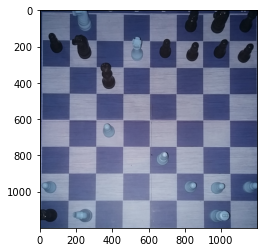

Done!


In [353]:
%matplotlib inline 

import numpy as np
import cv2
from matplotlib import pyplot as plt
import glob

from rescale import *
from slid import detect_lines
from laps import LAPS
from llr import LLR, llr_pad



path = "/Users/rizo/Dropbox/chess/check.jpg"
src = cv2.imread(path)
img_cropped = src.copy()
for i in range(2):
    # src = cv2.Canny(src, 150, 200, None, 3)
    img, shape, scale = image_resize(img_cropped)
    lines = detect_lines(img)
    # filter_lines(lines)
    lattice_points = LAPS(img, lines)
    try: 
        inner_points = LLR(img, lattice_points, lines)
        four_points = llr_pad(inner_points, img) # padcrop

        print(four_points)
        try: img_cropped = crop(img_cropped, four_points, scale)
        except:
            print("WARNING: too much cropping")
            img_cropped = crop(img_cropped, inner_points, scale)

        i += 1
    except:
        print("Skipped")
        skipped += 1
plt.imshow(img_cropped)
        # plt.imsave("test_data/%i.png" % i, img_cropped)
plt.show()
print("Done!")  

896 898 1193 1194


ValueError: zero-size array to reduction operation minimum which has no identity

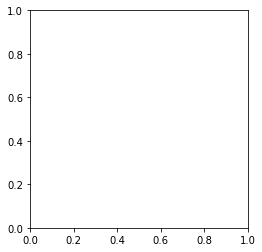

In [7]:
import math
import cv2
import numpy as np
import scipy.spatial as spatial
import scipy.cluster as cluster
from collections import defaultdict
from statistics import mean
import chess
# import chess.svg
# from svglib.svglib import svg2rlg
# from reportlab.graphics import renderPM
from PIL import Image
import re
import glob
import PIL


# Read image and do lite image processing
def read_img(file):
    img = cv2.imread(str(file))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.blur(gray, (5, 5))
    return img, gray_blur


# Canny edge detection
def canny_edge(img, sigma=0.33):
    v = np.median(img)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edges = cv2.Canny(img, lower, upper)
    return edges


# Hough line detection
def hough_line(edges, min_line_length=100, max_line_gap=10):
    lines = cv2.HoughLines(edges, 1, np.pi / 180, 125, min_line_length, max_line_gap)
    lines = np.reshape(lines, (-1, 2))
    return lines


# Separate line into horizontal and vertical
def h_v_lines(lines):
    h_lines, v_lines = [], []
    for rho, theta in lines:
        if theta < np.pi / 4 or theta > np.pi - np.pi / 4:
            v_lines.append([rho, theta])
        else:
            h_lines.append([rho, theta])
    return h_lines, v_lines


# Find the intersections of the lines
def line_intersections(h_lines, v_lines):
    points = []
    for r_h, t_h in h_lines:
        for r_v, t_v in v_lines:
            a = np.array([[np.cos(t_h), np.sin(t_h)], [np.cos(t_v), np.sin(t_v)]])
            b = np.array([r_h, r_v])
            inter_point = np.linalg.solve(a, b)
            points.append(inter_point)
    return np.array(points)


# Hierarchical cluster (by euclidean distance) intersection points
def cluster_points(points):
    dists = spatial.distance.pdist(points)
    single_linkage = cluster.hierarchy.single(dists)
    flat_clusters = cluster.hierarchy.fcluster(single_linkage, 15, 'distance')
    cluster_dict = defaultdict(list)
    for i in range(len(flat_clusters)):
        cluster_dict[flat_clusters[i]].append(points[i])
    cluster_values = cluster_dict.values()
    clusters = map(lambda arr: (np.mean(np.array(arr)[:, 0]), np.mean(np.array(arr)[:, 1])), cluster_values)
    return sorted(list(clusters), key=lambda k: [k[1], k[0]])


# Average the y value in each row and augment original points
def augment_points(points):
    points_shape = list(np.shape(points))
    augmented_points = []
    for row in range(int(points_shape[0] / 11)):
        start = row * 11
        end = (row * 11) + 10
        rw_points = points[start:end + 1]
        rw_y = []
        rw_x = []
        for point in rw_points:
            x, y = point
            rw_y.append(y)
            rw_x.append(x)
        y_mean = mean(rw_y)
        for i in range(len(rw_x)):
            point = (rw_x[i], y_mean)
            augmented_points.append(point)
    augmented_points = sorted(augmented_points, key=lambda k: [k[1], k[0]])
    return augmented_points


# Crop board into separate images and write to folder
def write_crop_images(img, points, img_count=0, folder_path='./Data/raw_data/'):
    num_list = []
    shape = list(np.shape(points))
    start_point = shape[0] - 14

    if int(shape[0] / 11) >= 8:
        range_num = 8
    else:
        range_num = int((shape[0] / 11) - 2)

    for row in range(range_num):
        start = start_point - (row * 11)
        end = (start_point - 8) - (row * 11)
        num_list.append(range(start, end, -1))

    for row in num_list:
        for s in row:
            # ratio_h = 2
            # ratio_w = 1
            base_len = math.dist(points[s], points[s + 1])
            bot_left, bot_right = points[s], points[s + 1]
            start_x, start_y = int(bot_left[0]), int(bot_left[1] - (base_len * 2))
            end_x, end_y = int(bot_right[0]), int(bot_right[1])
            if start_y < 0:
                start_y = 0
            print(start_y, end_y, start_x, end_x)
            cropped = img[start_y: end_y, start_x: end_x]
            img_count += 1
            plt.imshow(cropped)
            plt.show()
            # cv2.imwrite('./Data/raw_data/data_image' + str(img_count) + '.jpeg', cropped)
            # print(folder_path + 'data' + str(img_count) + '.jpeg')
    # return img_count

# Low-level CV techniques (grayscale & blur)
# img, gray_blur = read_img('frame.jpeg')
# Canny algorithm
edges = canny_edge(img_cropped)
# Hough Transform
lines = hough_line(edges)
# Separate the lines into vertical and horizontal lines
h_lines, v_lines = h_v_lines(lines)
# Find and cluster the intersecting
intersection_points = line_intersections(h_lines, v_lines)
points = cluster_points(intersection_points)
# Final coordinates of the board
points = augment_points(points)
# Crop the squares of the board a organize into a sorted list
write_crop_images(img, points, 0)

In [6]:
points

[(25.055597, 66.682945),
 (173.32475, 66.682945),
 (313.43442, 66.682945),
 (460.4962, 66.682945),
 (462.02148, 66.682945),
 (600.59406, 66.682945),
 (600.95734, 66.682945),
 (741.907, 66.682945),
 (887.41797, 66.682945),
 (1032.9575, 66.682945),
 (1187.4407, 66.682945),
 (20.390284, 234.7071),
 (22.513044, 234.7071),
 (170.7826, 234.7071),
 (312.3449, 234.7071),
 (743.178, 234.7071),
 (888.68915, 234.7071),
 (889.9068, 234.7071),
 (1034.6526, 234.7071),
 (1036.2664, 234.7071),
 (1188.7119, 234.7071),
 (1189.9144, 234.7071),
 (17.587252, 392.2187),
 (19.909039, 392.2187),
 (165.85753, 392.2187),
 (168.27406, 392.2187),
 (310.23416, 392.2187),
 (311.2762, 392.2187),
 (459.00882, 392.2187),
 (601.3098, 392.2187),
 (601.6608, 392.2187),
 (744.40314, 392.2187),
 (745.64056, 392.2187),
 (309.14316, 559.592),
 (456.02032, 559.592),
 (457.54117, 559.592),
 (602.02136, 559.592),
 (746.8968, 559.592),
 (891.1516, 559.592),
 (892.4023, 559.592),
 (1037.9364, 559.592),
 (1039.5966, 559.592),
 (11

(25.055597, 66.682945)
(173.32475, 66.682945)
(313.43442, 66.682945)
(460.4962, 66.682945)
(462.02148, 66.682945)
(600.59406, 66.682945)
(600.95734, 66.682945)
(741.907, 66.682945)
(887.41797, 66.682945)
(1032.9575, 66.682945)
(1187.4407, 66.682945)
(20.390284, 234.7071)
(22.513044, 234.7071)
(170.7826, 234.7071)
(312.3449, 234.7071)
(743.178, 234.7071)
(888.68915, 234.7071)
(889.9068, 234.7071)
(1034.6526, 234.7071)
(1036.2664, 234.7071)
(1188.7119, 234.7071)
(1189.9144, 234.7071)
(17.587252, 392.2187)
(19.909039, 392.2187)
(165.85753, 392.2187)
(168.27406, 392.2187)
(310.23416, 392.2187)
(311.2762, 392.2187)
(459.00882, 392.2187)
(601.3098, 392.2187)
(601.6608, 392.2187)
(744.40314, 392.2187)
(745.64056, 392.2187)
(309.14316, 559.592)
(456.02032, 559.592)
(457.54117, 559.592)
(602.02136, 559.592)
(746.8968, 559.592)
(891.1516, 559.592)
(892.4023, 559.592)
(1037.9364, 559.592)
(1039.5966, 559.592)
(1191.1744, 559.592)
(1192.4137, 559.592)
(12.592971, 728.0796)
(15.018597, 728.0796)
(1

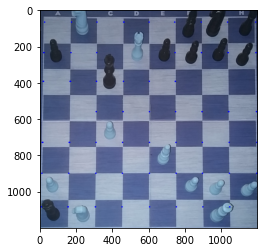

In [22]:
plt.imshow(plot_points(img_cropped, points, 4))

In [19]:
for pt in points:
    print(int(pt[0]))

25
173
313
460
462
600
600
741
887
1032
1187
20
22
170
312
743
888
889
1034
1036
1188
1189
17
19
165
168
310
311
459
601
601
744
745
309
456
457
602
746
891
892
1037
1039
1191
1192
12
15
160
163
308
454
602
748
893
1041
1193
10
158
307
453
602
749
894
1042
1193
1194
1196
4
7
153
155
304
305
451
603
750
896
1044
